Here, I view genome tracks with pseudobulked expression values.

In [1]:
getwd()

[1] "/fast/AG_Bunina/Yusuf/Project_Endothelial_and_Stroke/Datasets/Chromatin_and_Gene_Exp/2024_C_A_Mannens_C_et_al/04_02_25"

In [2]:
.libPaths()

[1] "/fast/home/y/ykazci/R/x86_64-unknown-linux-gnu-library/4.3"               
[2] "/gnu/store/asn7yfxccx9hqi4afrnw685xw6c6382z-profile/site-library"         
[3] "/gnu/store/29x2k7i71g9xq09xmbj1lk515cl7if63-r-minimal-4.4.2/lib/R/library"

In [3]:
here::here()

[1] "/fast/AG_Bunina/Yusuf/Project_Endothelial_and_Stroke/Datasets/Chromatin_and_Gene_Exp/2024_C_A_Mannens_C_et_al/04_02_25"

In [4]:
# Retrieve the BPCells library path:

# The original BPCells guix profile contains less number of packages than the
# corresponding renv profile hydrated from the original guix profile.
# Therefore, I will use the renv library path.

bpcells_lib <- "/fast/AG_Bunina/Yusuf/Project_Endothelial_and_Stroke/renv_envs/BPCELLS/renv/library/linux-rhel-9.4/R-4.4/x86_64-unknown-linux-gnu"

In [5]:
.libPaths(new = bpcells_lib, include.site = FALSE)

In [6]:
.libPaths()

[1] "/fast/AG_Bunina/Yusuf/Project_Endothelial_and_Stroke/renv_envs/BPCELLS/renv/library/linux-rhel-9.4/R-4.4/x86_64-unknown-linux-gnu"
[2] "/gnu/store/29x2k7i71g9xq09xmbj1lk515cl7if63-r-minimal-4.4.2/lib/R/library"

In [7]:
library(BPCells)

In [8]:
mat_lsi <- open_matrix_dir(dir = here::here('bpcells_counts/mat_lsi')) # previously copied to this new location

In [9]:
mat_lsi

405121 x 49470 IterableMatrix object with class MatrixDir

Row names: chr10:100006329-100006730, chr10:100009751-100010152 ... chrY:7729552-7729953
Col names: 10X280_1:CAGATTCAGCAGCTCA, 10X365_2:ACCAATATCAATGACC ... 10X406_4:GAGAAACGTGGTGAGA

Data type: double
Storage order: column major

Queued Operations:
1. Load compressed matrix from directory /fast/AG_Bunina/Yusuf/Project_Endothelial_and_Stroke/Datasets/Chromatin_and_Gene_Exp/2024_C_A_Mannens_C_et_al/04_02_25/bpcells_counts/mat_lsi

In [10]:
suppressPackageStartupMessages({
  library(GenomicRanges)
  library(Biostrings)
})

In [11]:
subsetted_fragments <- open_fragments_dir(dir = here::here('bpcells_counts', 'subsetted_fragments'))

In [12]:
subsetted_fragments

IterableFragments object of class "FragmentsDir"

Cells: 49470 cells with names 10X280_1:CAGATTCAGCAGCTCA-1, 10X365_2:ACCAATATCAATGACC-1 ... 10X406_4:GAGAAACGTGGTGAGA-1
Chromosomes: 45 chromosomes with names chr10, chr11 ... chr1_KI270711v1

Queued Operations:
1. Read compressed fragments from directory /fast/AG_Bunina/Yusuf/Project_Endothelial_and_Stroke/Datasets/Chromatin_and_Gene_Exp/2024_C_A_Mannens_C_et_al/04_02_25/bpcells_counts/subsetted_fragments

In [13]:
# read metadata to use cell types:

metadata <- readRDS(file = here::here('r_objects', 'metadata.RDS'))

In [14]:
metadata |> head() |> print() 

                          orig.ident nCount_RNA nFeature_RNA
10X280_1:CAGATTCAGCAGCTCA     10X280       4735         2198
10X365_2:ACCAATATCAATGACC     10X365       4031         1628
10X365_2:ATGGTGCGTCACCTAT     10X365       4454         1277
10X280_1:ACACCTTGTCATTAGG     10X280       3976         1850
10X406_1:TATCGCGAGGCTTAAC     10X406       3896         1631
10X280_1:ACCTTGCTCCGTAAAC     10X280       3794         1556
                          before_filtering_orig.ident
10X280_1:CAGATTCAGCAGCTCA                      10X280
10X365_2:ACCAATATCAATGACC                      10X365
10X365_2:ATGGTGCGTCACCTAT                      10X365
10X280_1:ACACCTTGTCATTAGG                      10X280
10X406_1:TATCGCGAGGCTTAAC                      10X406
10X280_1:ACCTTGCTCCGTAAAC                      10X280
                          before_filtering_nCount_RNA
10X280_1:CAGATTCAGCAGCTCA                        4936
10X365_2:ACCAATATCAATGACC                        4243
10X365_2:ATGGTGCGTCACCTAT        

In [15]:
mat_lsi |> rownames() |> head()

[1] "chr10:100006329-100006730" "chr10:100009751-100010152"
[3] "chr10:100016741-100017142" "chr10:100019766-100020167"
[5] "chr10:100020276-100020677" "chr10:100020877-100021278"

In [16]:
library(magrittr)


Attaching package: 'magrittr'


The following object is masked from 'package:GenomicRanges':

    subtract




In [17]:
peaks_gr <-  readRDS(here::here('r_objects', 'peaks_granges_for_TF_footprinting_by_BPCells.RDS'))

In [18]:
genome_annotation_dir <- "/fast/AG_Bunina/Yusuf/Project_Endothelial_and_Stroke/renv_envs/BPCELLS/pbmc-3k/references"

genes_info <- read_gencode_transcripts(
  genome_annotation_dir, 
  release="42", 
  transcript_choice="MANE_Select",
  annotation_set = "basic", 
  features="transcript" # Make sure to set this so we don't get exons as well
)
head(genes_info)

chr,source,feature,start,end,score,strand,frame,gene_id,gene_type,gene_name,transcript_id,MANE_Select
<chr>,<chr>,<chr>,<dbl>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<lgl>
chr1,HAVANA,transcript,65418,71585,.,+,.,ENSG00000186092.7,protein_coding,OR4F5,ENST00000641515.2,TRUE
chr1,HAVANA,transcript,450739,451678,.,-,.,ENSG00000284733.2,protein_coding,OR4F29,ENST00000426406.4,TRUE
chr1,HAVANA,transcript,685715,686654,.,-,.,ENSG00000284662.2,protein_coding,OR4F16,ENST00000332831.5,TRUE
chr1,HAVANA,transcript,923922,944574,.,+,.,ENSG00000187634.13,protein_coding,SAMD11,ENST00000616016.5,TRUE
chr1,HAVANA,transcript,944202,959256,.,-,.,ENSG00000188976.11,protein_coding,NOC2L,ENST00000327044.7,TRUE
chr1,HAVANA,transcript,960583,965719,.,+,.,ENSG00000187961.15,protein_coding,KLHL17,ENST00000338591.8,TRUE


In [19]:
my_human_pwms_v2 <-  readRDS(here::here('r_objects', 'my_human_pwms_v2.RDS'))

In [21]:
# Write a custom function to wrap it up all of the necessary commands to plot TF footprints:

In [22]:
analyze_multiple_tf_footprints <- function(tf_names, peaks_gr, fragments, metadata, pwms_mat, genes, line_thickness = 1.5) {
  suppressPackageStartupMessages({
    library(stringr)
    library(motifmatchr)
    library(chromVARmotifs)
    library(ggplot2)
    library(patchwork)
  })
  
  if (!is.character(tf_names)) {
    stop("tf_names must be a character vector of transcription factor names.")
  }
  
  motif_matches <- unlist(lapply(tf_names, function(tf) {
    names(pwms_mat) |> str_subset(pattern = tf)
  }))
  
  if (length(motif_matches) == 0) {
    stop("No motifs found for the given TF names. Check the input names.")
  }
  
  selected_motifs <- setNames(motif_matches, tf_names)
  
  message("Motifs selected: ", paste(names(selected_motifs), collapse = ", "))
  
  suppressWarnings({
    motif_positions <- motifmatchr::matchMotifs(
      pwms_mat[selected_motifs], # replaced chromVARmotifs::human_pwms_v2 with pwms_mat
      peaks_gr, genome = "hg38", out = "positions"
    )
  })
  
  names(motif_positions) <- names(selected_motifs)
  
  footprinting_plots <- lapply(names(selected_motifs), function(motif) {
    plot_tf_footprint(
      fragments,
      motif_positions[[motif]],
      cell_groups = metadata$main_cell_types,
       zero_based_coords = !is(genes, "GRanges"), # this is default from this function.
      flank = 250,
      smooth = 2
    ) +
      ggplot2::labs(title = motif) +
      ggplot2::theme_minimal() +  # Clean theme
      ggplot2::theme(
        plot.title = ggplot2::element_text(size = 14, face = "bold")
      ) +
      ggplot2::guides(color = ggplot2::guide_legend(title = "Cell Type")) +
      ggplot2::geom_line(linewidth = line_thickness)  # Adjusts line thickness
  })
  
  if (length(footprinting_plots) == 1) {
    return(footprinting_plots[[1]])  
  } else {
    return(patchwork::wrap_plots(footprinting_plots, guides = "collect", ncol = 1))
  }
}

In [23]:
suppressPackageStartupMessages({
  library(GenomicRanges)
  library(Biostrings)
})

In [25]:
highlight_EC_v2 <- ggplot2::scale_color_manual(values =  c("#F6222EFF", rep(x = "#D3D3D380", times = 8) ))

In [26]:
# test the revised function:

p1 <- analyze_multiple_tf_footprints(tf_name = c('BHLHE40'),  
                               peaks_gr = peaks_gr,
                               genes = genes_info,
                               fragments = subsetted_fragments, 
                               metadata = metadata, 
                               pwms_mat = my_human_pwms_v2,
                               line_thickness = 1)

p2 <- p1 + highlight_EC_v2

Motifs selected: BHLHE40


Attaching package: 'rtracklayer'


The following object is masked from 'package:BiocIO':

    FileForFormat


Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.


In [27]:
my_theme <- ggplot2::theme(
    axis.title.x = ggplot2::element_text(size = 14),  # X-axis title size
    axis.title.y = ggplot2::element_text(size = 14),  # Y-axis title size
    axis.text.x  = ggplot2::element_text(size = 14, angle = 45, hjust = 1),  # X-axis tick labels
    axis.text.y  = ggplot2::element_text(size = 14),  # Y-axis tick labels
    legend.text  = ggplot2::element_text(size = 15)   # Legend text size
)

my_margin <- ggplot2::theme(plot.margin = ggplot2::unit(c(1, 1, 1, 1), "cm"))  # Add margin to top, right, bottom, and left margins, respectively.

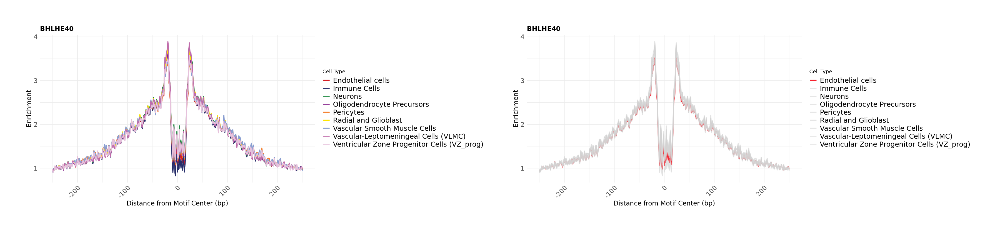

In [32]:
options(repr.plot.width = 30, repr.plot.height = 7)

p1 + p2 & my_theme & my_margin

In [33]:
plot_multiple_TFs_w_highlights <- function(
                                               tf_genes, 
                                               peaks_gr, 
                                               fragments, 
                                               metadata, 
                                               pwms_mat,
                                               genes, # must be here.
                                               colors_highlight,
                                               line_thickness = 1) {


plot_list <- list()

    for (each_TF in tf_genes) {
    
    p1 <- analyze_multiple_tf_footprints(tf_names = each_TF, 
                               peaks_gr = peaks_gr, 
                               fragments = fragments, 
                               metadata = metadata, 
                               pwms_mat = my_human_pwms_v2,
                               genes = genes, # must be here.
                               line_thickness = 1)

    p2 <- p1 & colors_highlight

    plot_list[[each_TF]] <- p1 + p2 & my_theme & my_margin
        
    }

    return(plot_list)
}

In [34]:
# TFs with significant TF activity scores  in endothelial cells (within-cluster normalized):

TF_list <- c("BCL6B", "FOXF2", "SOX17", "TBX3") 

In [35]:
sapply(TF_list, function(x) { str_subset(names(human_pwms_v2), pattern = x) })

BCL6B                                 FOXF2 
   "ENSG00000161940_LINE1031_BCL6B_D" "ENSG00000137273_LINE1989_FOXF2_D_N2" 
                                SOX17                                  TBX3 
   "ENSG00000164736_LINE3425_SOX17_D"     "ENSG00000135111_LINE3538_TBX3_D"

In [36]:
my_important_TFs_plots <- plot_multiple_TFs_w_highlights(tf_genes = TF_list,
                                                   peaks_gr = peaks_gr,
                                                   fragments = subsetted_fragments,
                                                   metadata = metadata,
                                                   pwms_mat = human_pwms_v2,
                                                   genes = genes_info,
                                                   colors_highlight = highlight_EC_v2)

Motifs selected: BCL6B

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Motifs selected: FOXF2

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Motifs selected: SOX17

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Motifs selected: TBX3

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.


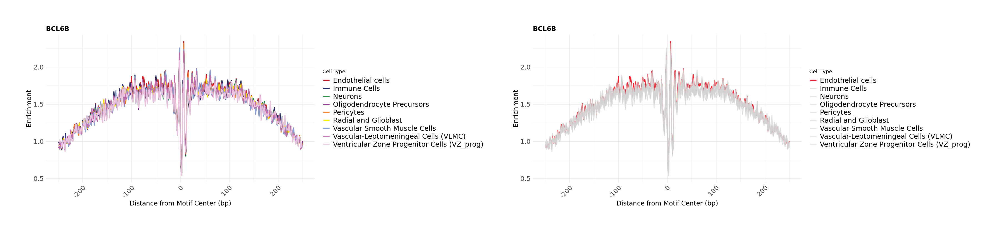

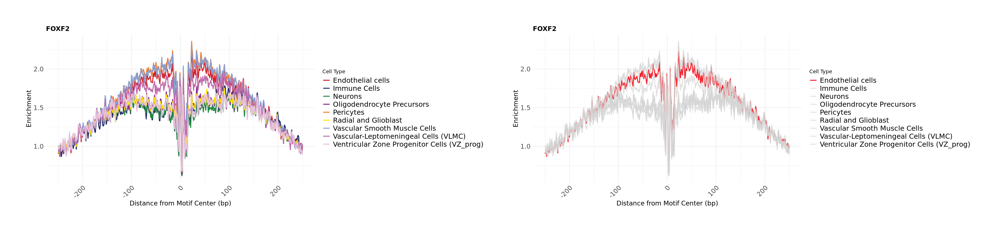

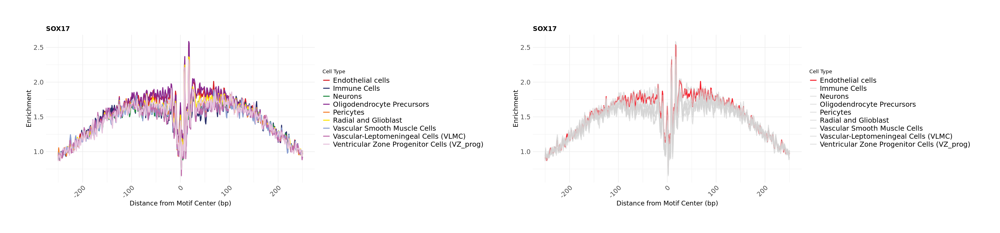

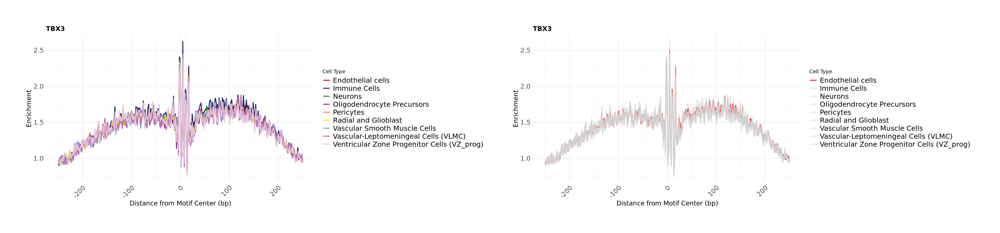

In [37]:
options(repr.plot.width = 30, repr.plot.height = 7)

for(each_plot in my_important_TFs_plots){

    print(each_plot)
    
    }

In [38]:
# To plot genome coverage, need following objects:

# Genome coverage plots:

blacklist <- read_encode_blacklist("./references", genome="hg38")
head(blacklist)

chr,start,end,reason
<chr>,<dbl>,<dbl>,<chr>
chr10,0,45700,Low Mappability
chr10,38481300,38596500,High Signal Region
chr10,38782600,38967900,High Signal Region
chr10,39901300,41712900,High Signal Region
chr10,41838900,42107300,High Signal Region
chr10,42279400,42322500,High Signal Region


In [39]:
atac_qc <- qc_scATAC(fragments = subsetted_fragments, genes_info, blacklist)

In [40]:
head(atac_qc)

cellName,TSSEnrichment,nFrags,subNucleosomal,monoNucleosomal,multiNucleosomal,ReadsInTSS,ReadsFlankingTSS,ReadsInPromoter,ReadsInBlacklist
<chr>,<dbl>,<int>,<int>,<int>,<int>,<dbl>,<dbl>,<dbl>,<dbl>
10X280_1:CAGATTCAGCAGCTCA-1,30.45792,24171,12179,8185,3807,2461,160,11967,243
10X365_2:ACCAATATCAATGACC-1,45.89400,15654,8498,5062,2094,1970,85,9232,152
10X365_2:ATGGTGCGTCACCTAT-1,39.60396,12236,6178,4184,1874,1560,78,7325,90
10X280_1:ACACCTTGTCATTAGG-1,38.66027,22027,10117,7979,3931,2499,128,11388,188
10X406_1:TATCGCGAGGCTTAAC-1,16.42744,29874,8226,16030,5618,1402,169,7435,147
10X280_1:ACCTTGCTCCGTAAAC-1,27.27443,20119,9121,6974,4024,2190,159,10674,182


In [41]:
atac_qc %>% saveRDS(here::here('r_objects', 'atac_qc_by_BPCells.RDS'))

In [42]:
read_counts <- atac_qc$nFrags[
  match(cellNames(x = subsetted_fragments), atac_qc$cellName)
]

In [43]:
read_counts %>% head()

[1] 24171 15654 12236 22027 29874 20119

In [44]:
read_counts %>% saveRDS(here::here('r_objects', 'atac_read_counts_by_BPCells.RDS'))

In [45]:
transcripts_info <- read_gencode_transcripts("./references", release="42")
head(transcripts_info)

chr,source,feature,start,end,score,strand,frame,gene_id,gene_type,gene_name,transcript_id,MANE_Select
<chr>,<chr>,<chr>,<dbl>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<lgl>
chr1,HAVANA,transcript,65418,71585,.,+,.,ENSG00000186092.7,protein_coding,OR4F5,ENST00000641515.2,TRUE
chr1,HAVANA,exon,65418,65433,.,+,.,ENSG00000186092.7,protein_coding,OR4F5,ENST00000641515.2,TRUE
chr1,HAVANA,exon,65519,65573,.,+,.,ENSG00000186092.7,protein_coding,OR4F5,ENST00000641515.2,TRUE
chr1,HAVANA,exon,69036,71585,.,+,.,ENSG00000186092.7,protein_coding,OR4F5,ENST00000641515.2,TRUE
chr1,HAVANA,transcript,450739,451678,.,-,.,ENSG00000284733.2,protein_coding,OR4F29,ENST00000426406.4,TRUE
chr1,HAVANA,exon,450739,451678,.,-,.,ENSG00000284733.2,protein_coding,OR4F29,ENST00000426406.4,TRUE


In [46]:
mat_rna_norm <- open_matrix_dir(dir = here::here('bpcells_counts', 'mat_rna_norm_w_gene_symbols'))

In [47]:
plot_gene_coverage_w_expression <- function(fragments, gene = NULL, cell_types, rna_data, total_reads_per_cell, bins_value, extend.bp, genes_info, transcripts_info) {

        
   region <- gene_region(genes_info, gene, extend_bp =  extend.bp)     

        coverage_plot <- trackplot_coverage(
  fragments, # frags
  region = region, 
  groups=cell_types,
  total_reads_per_cell,
  bins=bins_value
)

        # expand_by: 
    
    #         granges_obj <- 
    # GenomicRanges::resize(granges_obj, 
    #                       width = GenomicRanges::width(granges_obj) + 2 * expand_by, 
    #                       fix = "center")
    

    p1 <- coverage_plot + my_margin + ggplot2::theme(
    strip.text = ggplot2::element_text(size = 11, face = "bold"),  # Increase facet label (cell type) font size
    axis.title.x = ggplot2::element_text(size = 14),  
    axis.title.y = ggplot2::element_text(size = 14),  
    axis.text.x  = ggplot2::element_text(size = 14, angle = 0, hjust = 1),  
    axis.text.y  = ggplot2::element_text(size = 14),  
    legend.text  = ggplot2::element_text(size = 15)   
) +  ggtitle(gene) +  # Add the title
    theme(
        plot.title = element_text(
            hjust = 0.5,  # Center the title horizontally
            vjust = 1,    # Adjust the vertical position if needed
            size = 16,    # Set the font size
            face = "bold" # Make the title bold (optional)
        )
    )

    gene_plot <- trackplot_gene(transcripts_info, region)
    scalebar_plot <- trackplot_scalebar(region)


    # retrieve genbe expression value of a specific feature:

    	expression <- collect_features(rna_data, gene)
        names(expression) <- "gene"

    expression_plot <- ggplot2::ggplot(expression, ggplot2::aes(metadata$main_cell_types, gene, fill=metadata$main_cell_types)) +
    ggplot2::geom_boxplot() + 
    ggplot2::guides(y="none", fill="none") + 
    ggplot2::labs(x=NULL, y=paste0(gene, " RNA expression")) +
    ggplot2::scale_fill_manual(values=discrete_palette("stallion"), drop=FALSE) +
    BPCells:::trackplot_theme()
    
    p2 <- 
trackplot_combine(
  list(
    scalebar_plot, 
    p1, 
    gene_plot + ggplot2::guides(color="none")
  ), side_plot = expression_plot
    
)

    return(p2)

}   

In [48]:
# add highlight buffer as parameter:

library(ggplot2)

plot_detailed_genome_coverage_w_EXPRESSION <- function(fragments, my_region, tf_name, target_name, rna_data, cell_types, total_reads_per_cell, bins_value, extend.bp, genes_info, transcripts_info, highlight_buffer = 50) {
    
    # Parse the user-provided region ('chr:start-end')
    original_region <- list(
        chr = str_split_i(my_region, pattern = ':', i = 1), 
        start = as.numeric(str_split_i(str_split_i(my_region, pattern = ':', i = 2), pattern = '-', i = 1)),
        end = as.numeric(str_split_i(str_split_i(my_region, pattern = ':', i = 2), pattern = '-', i = 2))
    )   
    
    # Expand the region
    region <- list(
        chr = original_region$chr,
        start = max(0, original_region$start - extend.bp),  # Prevent negative start values
        end = original_region$end + extend.bp
    )

    # Print the expanded and original regions for debugging
    print(paste("Expanded region:", region$chr, region$start, region$end))
    print(paste("Original region:", original_region$chr, original_region$start, original_region$end))

    # Generate coverage plot
    coverage_plot <- trackplot_coverage(
        fragments, 
        region = region, 
        groups = cell_types,
        total_reads_per_cell,
        bins = bins_value
    )

    
 # All these commands below are different working versions of the annotaion command.
    # I will keep them, however, I un-commented only the one that I currently use.

    highlight_buffer <- highlight_buffer  # Expand each side by.
coverage_plot <- coverage_plot +
    annotate(
        "rect",
        xmin = original_region$start - highlight_buffer, 
        xmax = original_region$end + highlight_buffer, 
        ymin = -Inf, 
        ymax = Inf,
        fill = "red", 
        alpha = 0.2
    )

  # Other alternative annotation commands:
    
    # Annotate the original region as a red shaded box using `annotate()`
    # coverage_plot <- coverage_plot +
    #     annotate(
    #         "rect",
    #         xmin = original_region$start, 
    #         xmax = original_region$end, 
    #         ymin = -Inf, 
    #         ymax = Inf,
    #         fill = "red", alpha = 0.2  # Semi-transparent red
    #     ) +
    #     annotate(
    #         "text",
    #         x = (original_region$start + original_region$end) / 2, 
    #         y = max(total_reads_per_cell, na.rm = TRUE) * 0.9, 
    #         label = "Input Region",
    #         color = "red", size = 5, fontface = "bold"
    #     )

########################################################
        # coverage_plot <- coverage_plot +
        # annotate(
        #     "rect",
        #     xmin = original_region$start, 
        #     xmax = original_region$end, 
        #     ymin = -Inf, 
        #     ymax = Inf,
        #     fill = "red", alpha = 0.2
        # ) +
        # annotate(
        #     "text",
        #     x = (original_region$start + original_region$end) / 2, 
        #     y = max(total_reads_per_cell, na.rm = TRUE) * 0.5,  # Reduce from 0.9 to 0.5
        #     label = "Input Region",
        #     color = "red", size = 5, fontface = "bold"
        # )

    #####################################################################
    
    # coverage_plot <- coverage_plot +
    # # Highlight the original region with a semi-transparent red rectangle
    # annotate(
    #     "rect",
    #     xmin = original_region$start, 
    #     xmax = original_region$end, 
    #     ymin = -Inf, 
    #     ymax = Inf,
    #     fill = "red", alpha = 0.2  # Light red shading for visibility
    # ) +
    # # Add a text label at a fixed y-position
    # annotate(
    #     "text",
    #     x = (original_region$start + original_region$end) / 2,  # Center of original region
    #     y = 50,  # Fixed y-position (adjust as needed)
    #     label = "Input Region",
    #     color = "red", size = 5, fontface = "bold"
    # )
    
####################################################################
    # coverage_plot <- coverage_plot +
    # geom_vline(xintercept = c(original_region$start, original_region$end), 
    #            color = "red", linetype = "dashed", size = 1) + 
    # annotate("text", 
    #          x = (original_region$start + original_region$end) / 2,  
    #          y = 50,
    #          label = "",
    #          color = "red", 
    #          size = 5, 
    #          fontface = "bold")

############################################################
    
    # Apply ggplot2 theme adjustments
    p1 <- coverage_plot + my_margin + ggplot2::theme(
        strip.text = ggplot2::element_text(size = 11, face = "bold"),
        axis.title.x = ggplot2::element_text(size = 14),  
        axis.title.y = ggplot2::element_text(size = 14),  
        axis.text.x  = ggplot2::element_text(size = 14, angle = 0, hjust = 1),  
        axis.text.y  = ggplot2::element_text(size = 14),  
        legend.text  = ggplot2::element_text(size = 15)
    ) +  ggtitle(label = paste0("TF: ", tf_name, ", target: ", target_name), subtitle = paste0("linked_region: ", my_region)) +  # Add the title
    theme(
        plot.title = element_text(
            hjust = 0.5,  # Center the title horizontally
            vjust = 1,    # Adjust the vertical position if needed
            size = 16,    # Set the font size
            face = "bold" # Make the title bold (optional)
        ),
    )

    # Generate gene and scalebar plots
                 
    gene_plot <- trackplot_gene(transcripts_info, region)
    scalebar_plot <- trackplot_scalebar(region)

    # retrieve genbe expression value of a specific feature:

    expression <- collect_features(rna_data, target_name)
    names(expression) <- "gene"

    expression_plot <- ggplot2::ggplot(expression, ggplot2::aes(metadata$main_cell_types, gene, fill=metadata$main_cell_types)) +
    ggplot2::geom_boxplot() + 
    ggplot2::guides(y="none", fill="none") + 
    ggplot2::labs(x=NULL, y=paste0(target_name, " RNA expression")) +
    ggplot2::scale_fill_manual(values=discrete_palette("stallion"), drop=FALSE) +
    BPCells:::trackplot_theme()
    
    # Combine plots
    p2 <- trackplot_combine(
        list(
            scalebar_plot, 
            p1, 
            gene_plot + ggplot2::guides(color = "none")
        ),
        side_plot = expression_plot
    )

    return(p2)
}

In [49]:
p1 <- plot_gene_coverage_w_expression(total_reads_per_cell = read_counts,
                                       rna_data = mat_rna_norm,
                                       bins_value = 500, 
                                       extend.bp = 1e5 , 
                                       genes_info = genes_info,
                                       transcripts_info = transcripts_info,
                                       fragments = subsetted_fragments,  
                                       gene = 'MECOM', 
                                       cell_types = metadata$main_cell_types)

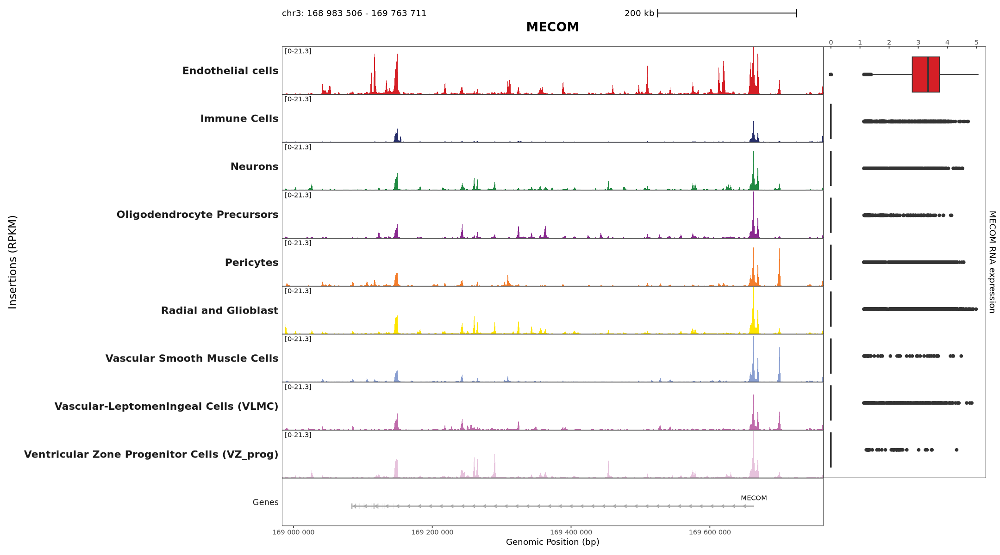

In [50]:
options(repr.plot.width = 18, repr.plot.height = 10)

p1

In [51]:
# Create pseudobulk matrix:

In [52]:
counts_RNA <- BPCells::open_matrix_dir( 
                          dir = here::here('bpcells_counts/mannens_rna_counts'))

In [53]:
mat_rna_pseudobulk <- pseudobulk_matrix(mat = counts_RNA, cell_groups = metadata$main_cell_types, method = "sum")

Normalize matrix before filtering out ensembl ids without gene names:

In [54]:
# Normalize by reads-per-cell
mat_rna_norm_pseudobulk <- multiply_cols(mat = mat_rna_pseudobulk, 1/Matrix::colSums(mat_rna_pseudobulk))

# Log normalization
mat_rna_norm_pseudobulk <- log1p(mat_rna_norm_pseudobulk * 10000) # Log normalization

In [55]:
mat_rna_norm_pseudobulk %>% head()

,Endothelial cells,Immune Cells,Neurons,Oligodendrocyte Precursors,Pericytes,Radial and Glioblast,Vascular Smooth Muscle Cells,Vascular-Leptomeningeal Cells (VLMC),Ventricular Zone Progenitor Cells (VZ_prog)
ENSG00000279457,0.0032115281,0.0112655768,0.0096690206,0.009068157,0.008040106,0.0120689556,0.01008671,0.007496120,0.008195189
ENSG00000237491,0.0347719823,0.1167897699,0.1348374551,0.088293401,0.054968753,0.1156270971,0.02502855,0.091035264,0.101631245
ENSG00000177757,0.0006431313,0.0119958986,0.0016642002,0.005450756,0.001344515,0.0017330801,0.01008671,0.001253262,0.000000000
ENSG00000230368,0.0000000000,0.0002462582,0.0002775591,0.000000000,0.001344515,0.0002890553,0.00000000,0.000000000,0.000000000
ENSG00000223764,0.0000000000,0.0002462582,0.0096690206,0.001820222,0.000896544,0.0031750227,0.00000000,0.007496120,0.000000000
ENSG00000187634,0.0096038071,0.0173353563,0.0740814731,0.032267587,0.007595125,0.0399538048,0.01008671,0.065524203,0.016323762


In [56]:
rm(mat_rna_pseudobulk)

In [64]:
my_seurat_env <- "/fast/AG_Bunina/Yusuf/Project_Endothelial_and_Stroke/renv_envs/seurat_signac/renv/library/linux-rhel-9.4/R-4.4/x86_64-unknown-linux-gnu"

In [70]:
library(package = 'ensembldb', lib.loc = my_seurat_env)

Loading required package: GenomicFeatures

Loading required package: AnnotationDbi

Loading required package: Biobase

Welcome to Bioconductor

    Vignettes contain introductory material; view with
    'browseVignettes()'. To cite Bioconductor, see
    'citation("Biobase")', and for packages 'citation("pkgname")'.


Loading required package: AnnotationFilter


Attaching package: 'AnnotationFilter'


The following object is masked from 'package:magrittr':

    not



Attaching package: 'ensembldb'


The following object is masked from 'package:stats':

    filter




In [71]:
library(package = 'EnsDb.Hsapiens.v86', lib.loc = my_seurat_env)

In [72]:
gene_annotation <- ensembldb::genes(EnsDb.Hsapiens.v86::EnsDb.Hsapiens.v86)

In [74]:
detach(package:EnsDb.Hsapiens.v86)

In [75]:
detach(package:ensembldb)

In [76]:
gene_annotation %>% head()

GRanges object with 6 ranges and 6 metadata columns:
                  seqnames      ranges strand |         gene_id   gene_name
                     <Rle>   <IRanges>  <Rle> |     <character> <character>
  ENSG00000223972        1 11869-14409      + | ENSG00000223972     DDX11L1
  ENSG00000227232        1 14404-29570      - | ENSG00000227232      WASH7P
  ENSG00000278267        1 17369-17436      - | ENSG00000278267   MIR6859-1
  ENSG00000243485        1 29554-31109      + | ENSG00000243485   MIR1302-2
  ENSG00000237613        1 34554-36081      - | ENSG00000237613     FAM138A
  ENSG00000268020        1 52473-53312      + | ENSG00000268020      OR4G4P
                            gene_biotype seq_coord_system      symbol
                             <character>      <character> <character>
  ENSG00000223972 transcribed_unproces..       chromosome     DDX11L1
  ENSG00000227232 unprocessed_pseudogene       chromosome      WASH7P
  ENSG00000278267                  miRNA       chromosome  

In [77]:
identical(gene_annotation$gene_name, gene_annotation$symbol)

[1] TRUE

In [79]:
gene_annotation %>% names() %>% head()

[1] "ENSG00000223972" "ENSG00000227232" "ENSG00000278267" "ENSG00000243485"
[5] "ENSG00000237613" "ENSG00000268020"

In [80]:
identical(names(gene_annotation), gene_annotation$gene_id)

[1] TRUE

In [83]:
# Retrieve gene symbols:

ens_to_gene_df <- gene_annotation@elementMetadata %>% as.data.frame() %>% dplyr::select(gene_id, gene_name)

In [84]:
ens_to_gene_df %>% head()

,gene_id,gene_name
,<chr>,<chr>
1,ENSG00000223972,DDX11L1
2,ENSG00000227232,WASH7P
3,ENSG00000278267,MIR6859-1
4,ENSG00000243485,MIR1302-2
5,ENSG00000237613,FAM138A
6,ENSG00000268020,OR4G4P


In [85]:
ens_to_gene_df %>% dim()

[1] 63970     2

In [86]:
ens_to_gene_df$gene_id %>% duplicated() %>% table()

.
FALSE 
63970 

In [87]:
rownames(mat_rna_norm_pseudobulk) %>% head()

[1] "ENSG00000279457" "ENSG00000237491" "ENSG00000177757" "ENSG00000230368"
[5] "ENSG00000223764" "ENSG00000187634"

In [88]:
overlapping_ids <- intersect(ens_to_gene_df$gene_id, rownames(mat_rna_norm_pseudobulk))

In [89]:
mat_rna_norm_pseudobulk <- mat_rna_norm_pseudobulk[overlapping_ids,]

In [90]:
overlapping_ids  %>% head()

[1] "ENSG00000279457" "ENSG00000237491" "ENSG00000177757" "ENSG00000230368"
[5] "ENSG00000223764" "ENSG00000187634"

In [91]:
ens_to_gene_df <- ens_to_gene_df %>% dplyr::filter(gene_id %in% overlapping_ids)

In [92]:
identical(ens_to_gene_df$gene_id, rownames(mat_rna_norm_pseudobulk))

[1] TRUE

In [93]:
mat_rna_norm_pseudobulk %>% head()

,Endothelial cells,Immune Cells,Neurons,Oligodendrocyte Precursors,Pericytes,Radial and Glioblast,Vascular Smooth Muscle Cells,Vascular-Leptomeningeal Cells (VLMC),Ventricular Zone Progenitor Cells (VZ_prog)
ENSG00000279457,0.0032115281,0.0112655768,0.0096690206,0.009068157,0.008040106,0.0120689556,0.01008671,0.007496120,0.008195189
ENSG00000237491,0.0347719823,0.1167897699,0.1348374551,0.088293401,0.054968753,0.1156270971,0.02502855,0.091035264,0.101631245
ENSG00000177757,0.0006431313,0.0119958986,0.0016642002,0.005450756,0.001344515,0.0017330801,0.01008671,0.001253262,0.000000000
ENSG00000230368,0.0000000000,0.0002462582,0.0002775591,0.000000000,0.001344515,0.0002890553,0.00000000,0.000000000,0.000000000
ENSG00000223764,0.0000000000,0.0002462582,0.0096690206,0.001820222,0.000896544,0.0031750227,0.00000000,0.007496120,0.000000000
ENSG00000187634,0.0096038071,0.0173353563,0.0740814731,0.032267587,0.007595125,0.0399538048,0.01008671,0.065524203,0.016323762


In [94]:
rownames(mat_rna_norm_pseudobulk) <- ens_to_gene_df$gene_name

In [95]:
mat_rna_norm_pseudobulk %>% head()

,Endothelial cells,Immune Cells,Neurons,Oligodendrocyte Precursors,Pericytes,Radial and Glioblast,Vascular Smooth Muscle Cells,Vascular-Leptomeningeal Cells (VLMC),Ventricular Zone Progenitor Cells (VZ_prog)
FO538757.1,0.0032115281,0.0112655768,0.0096690206,0.009068157,0.008040106,0.0120689556,0.01008671,0.007496120,0.008195189
RP11-206L10.9,0.0347719823,0.1167897699,0.1348374551,0.088293401,0.054968753,0.1156270971,0.02502855,0.091035264,0.101631245
FAM87B,0.0006431313,0.0119958986,0.0016642002,0.005450756,0.001344515,0.0017330801,0.01008671,0.001253262,0.000000000
FAM41C,0.0000000000,0.0002462582,0.0002775591,0.000000000,0.001344515,0.0002890553,0.00000000,0.000000000,0.000000000
RP11-54O7.3,0.0000000000,0.0002462582,0.0096690206,0.001820222,0.000896544,0.0031750227,0.00000000,0.007496120,0.000000000
SAMD11,0.0096038071,0.0173353563,0.0740814731,0.032267587,0.007595125,0.0399538048,0.01008671,0.065524203,0.016323762


In [96]:
gene_df <- mat_rna_norm_pseudobulk['MECOM',] %>% data.frame(gene = .)

In [97]:
gene_df

,gene
,<dbl>
Endothelial cells,3.3901270
Immune Cells,0.5491170
Neurons,0.4508401
Oligodendrocyte Precursors,0.3017551
Pericytes,1.3556281
Radial and Glioblast,1.6713605
Vascular Smooth Muscle Cells,0.7586675
Vascular-Leptomeningeal Cells (VLMC),1.1258945
Ventricular Zone Progenitor Cells (VZ_prog),0.8149292


In [98]:
mat_rna_norm_pseudobulk %>% dim()

[1] 20639     9

In [99]:
p_x <- ggplot(gene_df, aes(x = rownames(gene_df), y = gene, fill = rownames(gene_df))) +
geom_bar(stat = "identity") +
  ggplot2::guides(y="none", fill="none") + 
    ggplot2::labs(x=NULL, y="log1p(PseudoBulked_RNA") +
    ggplot2::scale_fill_manual(values=discrete_palette("stallion"), drop=FALSE) +
    BPCells:::trackplot_theme()

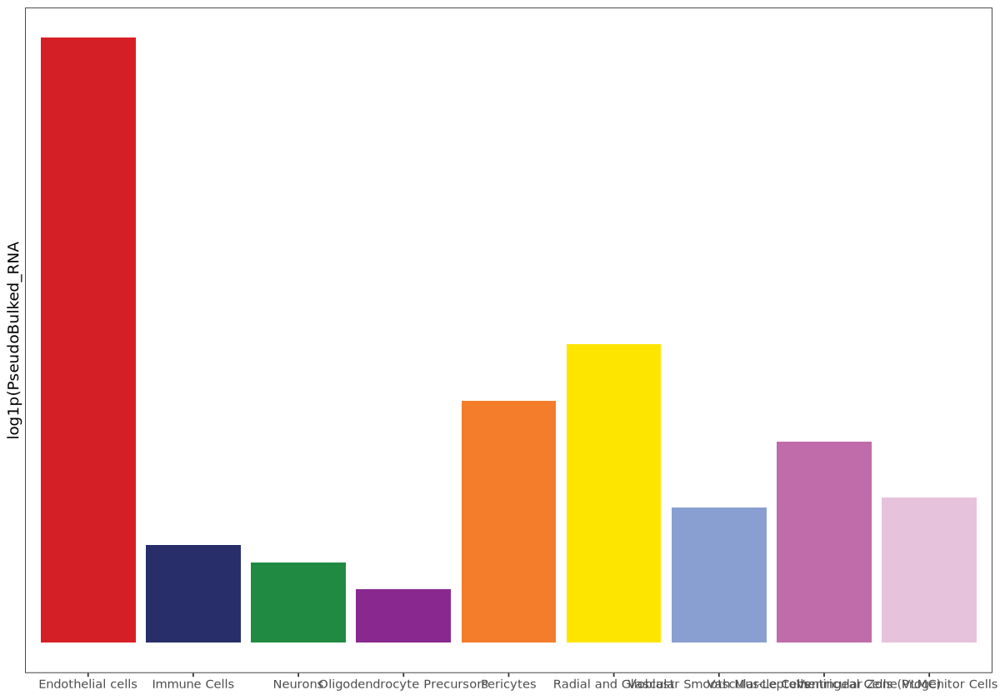

In [100]:
options(repr.plot.width = 10, repr.plot.height = 7)
p_x

In [101]:
# example region:

region <- gene_region(genes_info, "MECOM", extend_bp = 1e5)
region

$chr
[1] "chr3"

$start
[1] 168983506

$end
[1] 169763712

In [102]:
coverage_plot <- trackplot_coverage(
  subsetted_fragments, # frags
  region = region, 
  groups=metadata$main_cell_types,
  read_counts,
  bins=500
)

In [103]:
p1 <- coverage_plot + my_margin + ggplot2::theme(
    strip.text = ggplot2::element_text(size = 11, face = "bold"),  # Increase facet label (cell type) font size
    axis.title.x = ggplot2::element_text(size = 14),  
    axis.title.y = ggplot2::element_text(size = 14),  
    axis.text.x  = ggplot2::element_text(size = 14, angle = 0, hjust = 1),  
    axis.text.y  = ggplot2::element_text(size = 14),  
    legend.text  = ggplot2::element_text(size = 15)   
)

In [104]:
# add gene expression values to the coverage plot:

options(repr.plot.width = 30, repr.plot.height = 24)

gene_plot <- trackplot_gene(transcripts_info, region)
scalebar_plot <- trackplot_scalebar(region)

p_y <- trackplot_combine(
  list(
    scalebar_plot, 
    p1, 
    gene_plot + ggplot2::guides(color="none")
  ), side_plot = p_x,
)

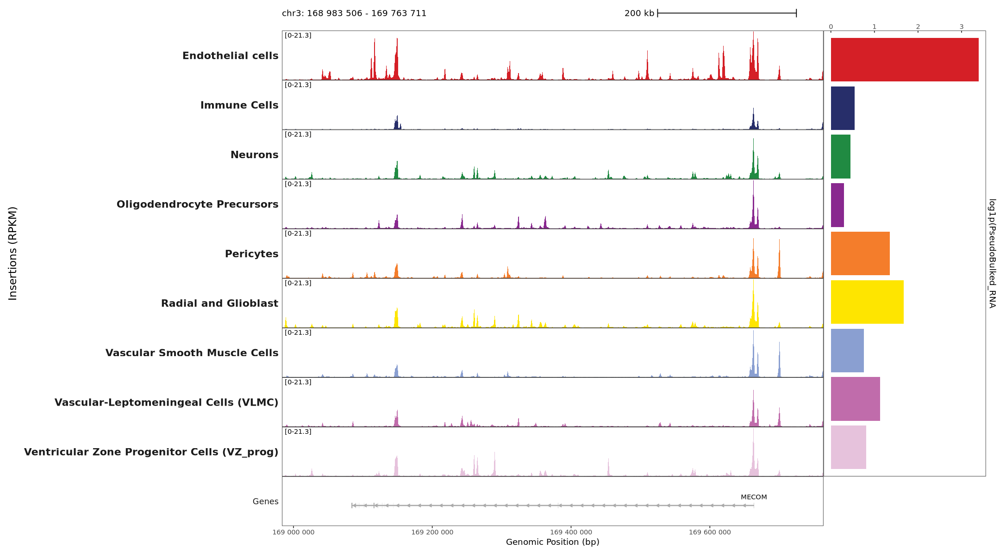

In [105]:
options(repr.plot.width = 18, repr.plot.height = 10)

p_y

In [106]:
plot_gene_coverage_w_BULK_expression <- function(fragments, 
                                                 gene = NULL, 
                                                 cell_types, 
                                                 bulked_rna_data, 
                                                 total_reads_per_cell, 
                                                 bins_value, 
                                                 extend.bp, 
                                                 genes_info, 
                                                 transcripts_info) {

        
   region <- gene_region(genes_info, gene, extend_bp =  extend.bp)     

        coverage_plot <- trackplot_coverage(
  fragments, # frags
  region = region, 
  groups=cell_types,
  total_reads_per_cell,
  bins=bins_value
)

        # expand_by: 
    
    #         granges_obj <- 
    # GenomicRanges::resize(granges_obj, 
    #                       width = GenomicRanges::width(granges_obj) + 2 * expand_by, 
    #                       fix = "center")
    

    p1 <- coverage_plot + my_margin + ggplot2::theme(
    strip.text = ggplot2::element_text(size = 11, face = "bold"),  # Increase facet label (cell type) font size
    axis.title.x = ggplot2::element_text(size = 14),  
    axis.title.y = ggplot2::element_text(size = 14),  
    axis.text.x  = ggplot2::element_text(size = 14, angle = 0, hjust = 1),  
    axis.text.y  = ggplot2::element_text(size = 14),  
    legend.text  = ggplot2::element_text(size = 15)   
) +  ggtitle(gene) +  # Add the title
    theme(
        plot.title = element_text(
            hjust = 0.5,  # Center the title horizontally
            vjust = 1,    # Adjust the vertical position if needed
            size = 16,    # Set the font size
            face = "bold" # Make the title bold (optional)
        )
    )

    gene_plot <- trackplot_gene(transcripts_info, region)
    scalebar_plot <- trackplot_scalebar(region)


    # retrieve genbe expression value of a specific feature:

    gene_df <- mat_rna_norm_pseudobulk[gene,] %>% data.frame(gene = .)

    expression_plot <- ggplot(gene_df, aes(x = rownames(gene_df), y = gene, fill = rownames(gene_df))) +
    geom_bar(stat = "identity") +
    ggplot2::guides(y="none", fill="none") + 
    ggplot2::labs(x=NULL, y="log1p(PseudoBulked_RNA") +
    ggplot2::scale_fill_manual(values=discrete_palette("stallion"), drop=FALSE) +
    BPCells:::trackplot_theme()
    
    p2 <- 
trackplot_combine(
  list(
    scalebar_plot, 
    p1, 
    gene_plot + ggplot2::guides(color="none")
  ), side_plot = expression_plot
    
)

    return(p2)

}   

In [107]:
p1 <- plot_gene_coverage_w_BULK_expression(total_reads_per_cell = read_counts,
                                       bulked_rna_data = mat_rna_norm_pseudobulk,
                                       bins_value = 500, 
                                       extend.bp = 1e5 , 
                                       genes_info = genes_info,
                                       transcripts_info = transcripts_info,
                                       fragments = subsetted_fragments,  
                                       gene = 'MECOM', 
                                       cell_types = metadata$main_cell_types)

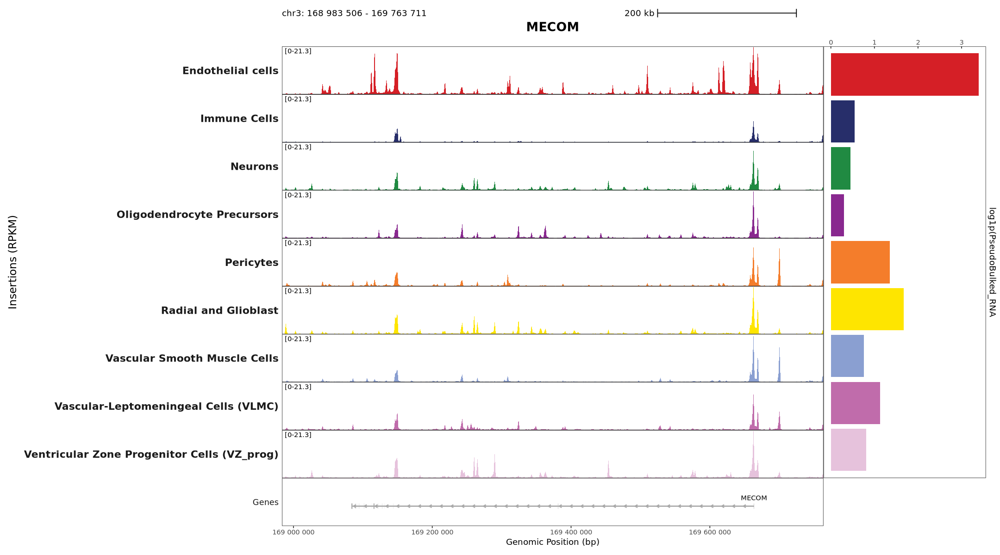

In [108]:
p1

In [109]:
# add highlight buffer as parameter:

library(ggplot2)

plot_detailed_genome_coverage_w_BULKED_EXPRESSION <- function(fragments, 
                                                              my_region, 
                                                              tf_name, 
                                                              target_name, 
                                                              bulked_rna_data, 
                                                              cell_types, 
                                                              total_reads_per_cell, 
                                                              bins_value, 
                                                              extend.bp, 
                                                              genes_info, 
                                                              transcripts_info, 
                                                              highlight_buffer = 50) {
    
    # Parse the user-provided region ('chr:start-end')
    original_region <- list(
        chr = str_split_i(my_region, pattern = ':', i = 1), 
        start = as.numeric(str_split_i(str_split_i(my_region, pattern = ':', i = 2), pattern = '-', i = 1)),
        end = as.numeric(str_split_i(str_split_i(my_region, pattern = ':', i = 2), pattern = '-', i = 2))
    )   
    
    # Expand the region
    region <- list(
        chr = original_region$chr,
        start = max(0, original_region$start - extend.bp),  # Prevent negative start values
        end = original_region$end + extend.bp
    )

    # Print the expanded and original regions for debugging
    print(paste("Expanded region:", region$chr, region$start, region$end))
    print(paste("Original region:", original_region$chr, original_region$start, original_region$end))

    # Generate coverage plot
    coverage_plot <- trackplot_coverage(
        fragments, 
        region = region, 
        groups = cell_types,
        total_reads_per_cell,
        bins = bins_value
    )

    
 # All these commands below are different working versions of the annotaion command.
    # I will keep them, however, I un-commented only the one that I currently use.

    highlight_buffer <- highlight_buffer  # Expand each side by.
coverage_plot <- coverage_plot +
    annotate(
        "rect",
        xmin = original_region$start - highlight_buffer, 
        xmax = original_region$end + highlight_buffer, 
        ymin = -Inf, 
        ymax = Inf,
        fill = "red", 
        alpha = 0.2
    )

  # Other alternative annotation commands:
    
    # Annotate the original region as a red shaded box using `annotate()`
    # coverage_plot <- coverage_plot +
    #     annotate(
    #         "rect",
    #         xmin = original_region$start, 
    #         xmax = original_region$end, 
    #         ymin = -Inf, 
    #         ymax = Inf,
    #         fill = "red", alpha = 0.2  # Semi-transparent red
    #     ) +
    #     annotate(
    #         "text",
    #         x = (original_region$start + original_region$end) / 2, 
    #         y = max(total_reads_per_cell, na.rm = TRUE) * 0.9, 
    #         label = "Input Region",
    #         color = "red", size = 5, fontface = "bold"
    #     )

########################################################
        # coverage_plot <- coverage_plot +
        # annotate(
        #     "rect",
        #     xmin = original_region$start, 
        #     xmax = original_region$end, 
        #     ymin = -Inf, 
        #     ymax = Inf,
        #     fill = "red", alpha = 0.2
        # ) +
        # annotate(
        #     "text",
        #     x = (original_region$start + original_region$end) / 2, 
        #     y = max(total_reads_per_cell, na.rm = TRUE) * 0.5,  # Reduce from 0.9 to 0.5
        #     label = "Input Region",
        #     color = "red", size = 5, fontface = "bold"
        # )

    #####################################################################
    
    # coverage_plot <- coverage_plot +
    # # Highlight the original region with a semi-transparent red rectangle
    # annotate(
    #     "rect",
    #     xmin = original_region$start, 
    #     xmax = original_region$end, 
    #     ymin = -Inf, 
    #     ymax = Inf,
    #     fill = "red", alpha = 0.2  # Light red shading for visibility
    # ) +
    # # Add a text label at a fixed y-position
    # annotate(
    #     "text",
    #     x = (original_region$start + original_region$end) / 2,  # Center of original region
    #     y = 50,  # Fixed y-position (adjust as needed)
    #     label = "Input Region",
    #     color = "red", size = 5, fontface = "bold"
    # )
    
####################################################################
    # coverage_plot <- coverage_plot +
    # geom_vline(xintercept = c(original_region$start, original_region$end), 
    #            color = "red", linetype = "dashed", size = 1) + 
    # annotate("text", 
    #          x = (original_region$start + original_region$end) / 2,  
    #          y = 50,
    #          label = "",
    #          color = "red", 
    #          size = 5, 
    #          fontface = "bold")

############################################################
    
    # Apply ggplot2 theme adjustments
    p1 <- coverage_plot + my_margin + ggplot2::theme(
        strip.text = ggplot2::element_text(size = 11, face = "bold"),
        axis.title.x = ggplot2::element_text(size = 14),  
        axis.title.y = ggplot2::element_text(size = 14),  
        axis.text.x  = ggplot2::element_text(size = 14, angle = 0, hjust = 1),  
        axis.text.y  = ggplot2::element_text(size = 14),  
        legend.text  = ggplot2::element_text(size = 15)
    ) +  ggtitle(label = paste0("TF: ", tf_name, ", target: ", target_name), subtitle = paste0("linked_region: ", my_region)) +  # Add the title
    theme(
        plot.title = element_text(
            hjust = 0.5,  # Center the title horizontally
            vjust = 1,    # Adjust the vertical position if needed
            size = 16,    # Set the font size
            face = "bold" # Make the title bold (optional)
        ),
    )

    # Generate gene and scalebar plots
                 
    gene_plot <- trackplot_gene(transcripts_info, region)
    scalebar_plot <- trackplot_scalebar(region)

    # retrieve genbe expression value of a specific feature:

    gene_df <- mat_rna_norm_pseudobulk[target_name,] %>% data.frame(gene = .)

    expression_plot <- ggplot(gene_df, aes(x = rownames(gene_df), y = gene, fill = rownames(gene_df))) +
    geom_bar(stat = "identity") +
    ggplot2::guides(y="none", fill="none") + 
    ggplot2::labs(x=NULL, y="log1p(PseudoBulked_RNA") +
    ggplot2::scale_fill_manual(values=discrete_palette("stallion"), drop=FALSE) +
    BPCells:::trackplot_theme()
    
    # Combine plots
    p2 <- trackplot_combine(
        list(
            scalebar_plot, 
            p1, 
            gene_plot + ggplot2::guides(color = "none")
        ),
        side_plot = expression_plot
    )

    return(p2)
}

[1] "Expanded region: chr20 31598421 31618822"
[1] "Original region: chr20 31608421 31608822"


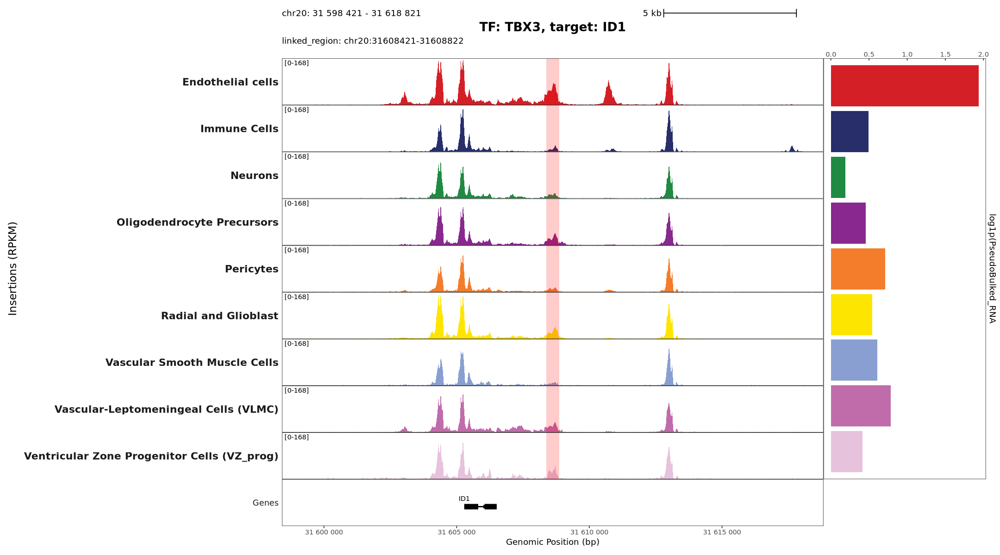

In [110]:
plot_detailed_genome_coverage_w_BULKED_EXPRESSION(
                               total_reads_per_cell = read_counts,
                               tf_name = "TBX3", 
                               target_name = "ID1",
                               my_region = "chr20:31608421-31608822",
                               bulked_rna_data = mat_rna_norm_pseudobulk,
                               bins_value = 500, 
                               extend.bp = 10000, # extend more
                               genes_info = genes_info,
                               transcripts_info = transcripts_info,
                               fragments = subsetted_fragments,  
                               cell_types = metadata$main_cell_types)

[1] "Expanded region: chr1 21527759 21548160"
[1] "Original region: chr1 21537759 21538160"


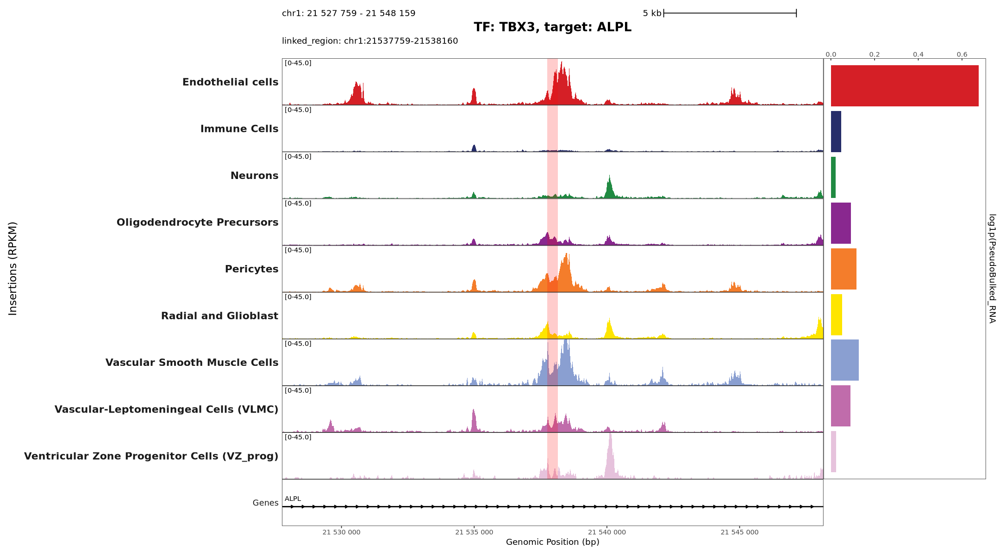

In [111]:
plot_detailed_genome_coverage_w_BULKED_EXPRESSION(
                               highlight_buffer = 0,
                               total_reads_per_cell = read_counts,
                               tf_name = "TBX3", 
                               target_name = "ALPL",
                               my_region = "chr1:21537759-21538160",
                               bulked_rna_data = mat_rna_norm_pseudobulk,
                               bins_value = 500, 
                               extend.bp = 10000, # extend more
                               genes_info = genes_info,
                               transcripts_info = transcripts_info,
                               fragments = subsetted_fragments,  
                               cell_types = metadata$main_cell_types)

[1] "Expanded region: chr1 21537259 21538660"
[1] "Original region: chr1 21537759 21538160"


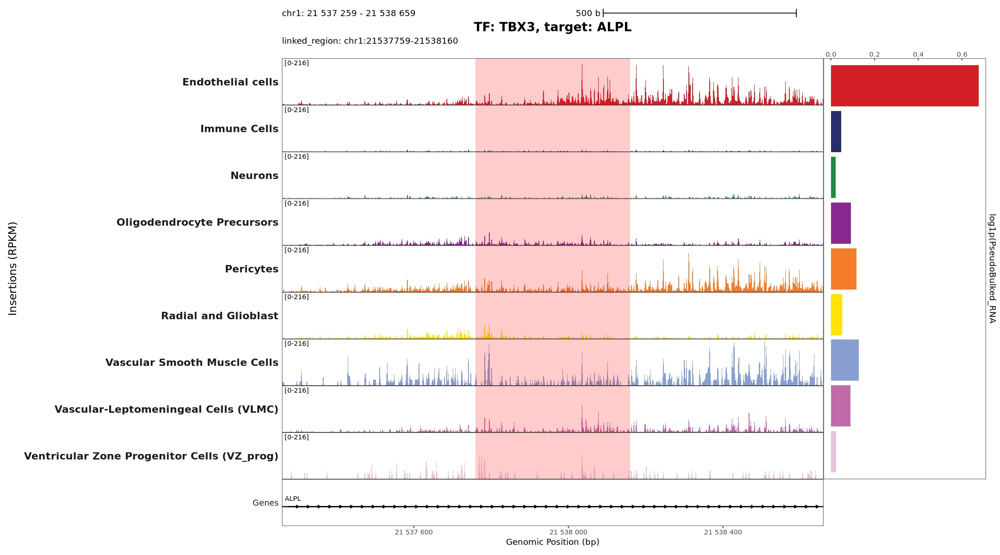

In [112]:
# exact region of insertions is highlighted:

plot_detailed_genome_coverage_w_BULKED_EXPRESSION(
                               highlight_buffer = 0,
                               total_reads_per_cell = read_counts,
                               tf_name = "TBX3", 
                               target_name = "ALPL",
                               my_region = "chr1:21537759-21538160",
                               bulked_rna_data = mat_rna_norm_pseudobulk,
                               bins_value = 500, 
                               extend.bp = 500, # extend more
                               genes_info = genes_info,
                               transcripts_info = transcripts_info,
                               fragments = subsetted_fragments,  
                               cell_types = metadata$main_cell_types)

In [113]:
# view zoomed out and zoomed in views of top TFs:

In [114]:
# import regulon data:

regulon.w_EC  <-  
    readRDS(here::here('r_objects', 'regulon_w_subset_by_EC.RDS'))

In [115]:
regulon.w_EC %>% head()

,idxATAC,chr,start,end,idxRNA,target,distance,idxTF,tf,corr_all,pval.endothelial_cells,stats.endothelial_cells,qval.endothelial_cells,weight.endothelial_cells,estimate,peak_regions
,<int>,<chr>,<int>,<int>,<int>,<chr>,<int>,<int>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
1,500,chr10,102452780,102453181,2743,SUFU,50780,1030,ADNP,0.5482681,0.8612509,0.03054877,1,0.06412986,0.06412986,chr10:102452780-102453181
2,3296,chr10,11685819,11686220,2195,USP6NL,74152,1030,ADNP,0.5946883,0.1846988,1.75940485,1,0.37074786,0.37074786,chr10:11685819-11686220
3,8072,chr10,16811761,16812162,2229,RSU1,5300,1030,ADNP,0.5749533,0.7676991,0.08725281,1,0.04413277,0.04413277,chr10:16811761-16812162
4,8249,chr10,17578642,17579043,2233,ST8SIA6,124046,1030,ADNP,0.7936897,0.1466853,2.10638704,1,0.40290026,0.40290026,chr10:17578642-17579043
5,9035,chr10,22615883,22616284,2254,PIP4K2A,98293,1030,ADNP,0.5910475,0.4075012,0.68607907,1,0.06965166,0.06965166,chr10:22615883-22616284
6,11842,chr10,3852277,3852678,2145,KLF6,66995,1030,ADNP,0.5239147,0.4476775,0.57652538,1,0.50932826,0.50932826,chr10:3852277-3852678


In [116]:
regulon.w_EC %>% dplyr::filter(qval.endothelial_cells < 0.1) %>% 
dplyr::arrange(desc(estimate)) %>% dplyr::filter(tf != target) %>% 
dplyr::filter(tf %in% c("BCL6B", "FOXF2", "SOX17", "TBX3"))

idxATAC,chr,start,end,idxRNA,target,distance,idxTF,tf,corr_all,pval.endothelial_cells,stats.endothelial_cells,qval.endothelial_cells,weight.endothelial_cells,estimate,peak_regions
<int>,<chr>,<int>,<int>,<int>,<chr>,<int>,<int>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
182718,chr20,31608421,31608822,12370,ID1,3137,1225,TBX3,0.6144007,7.072513e-10,38.00054,1.485610e-03,0.54413211,0.54413211,chr20:31608421-31608822
293573,chr5,138469852,138470253,16057,EGR1,4372,116,FOXF2,0.8632200,1.663857e-08,31.85191,3.477596e-02,0.50165132,0.50165132,chr5:138469852-138470253
405082,chrY,19075893,19076294,20654,TTTY14,1121,935,SOX17,0.8359503,7.369847e-34,147.12476,1.582753e-27,0.49332430,0.49332430,chrY:19075893-19076294
103409,chr16,50520444,50520845,7552,NKD1,27550,1225,TBX3,0.5305240,7.218012e-10,37.96081,1.516152e-03,0.47469693,0.47469693,chr16:50520444-50520845
103445,chr16,50617295,50617696,7552,NKD1,68898,1225,TBX3,0.5730377,4.427668e-09,34.42601,9.274689e-03,0.46736333,0.46736333,chr16:50617295-50617696
16311,chr10,71263364,71263765,2480,UNC5B,50793,935,SOX17,0.7827859,1.711990e-08,31.79652,3.577778e-02,0.46498106,0.46498106,chr10:71263364-71263765
160242,chr1,21537759,21538160,284,ALPL,28361,1225,TBX3,0.6246358,3.204331e-20,84.85891,6.841805e-14,0.45334771,0.45334771,chr1:21537759-21538160
103407,chr16,50502569,50502970,7552,NKD1,45425,1225,TBX3,0.5929545,8.336054e-11,42.17734,1.755779e-04,0.44268102,0.44268102,chr16:50502569-50502970
168431,chr1,34843966,34844367,481,GJA4,50966,935,SOX17,0.7171832,2.371569e-37,163.10613,5.096901e-31,0.41991374,0.41991374,chr1:34843966-34844367


In [117]:
selected_regions <- regulon.w_EC %>% dplyr::filter(qval.endothelial_cells < 0.1) %>% 
dplyr::arrange(desc(estimate)) %>% dplyr::filter(tf != target) %>% 
dplyr::filter(tf %in% c("BCL6B", "FOXF2", "SOX17", "TBX3")) %>% 
dplyr::pull(peak_regions)

In [118]:
respective_tf_names <- regulon.w_EC %>% dplyr::filter(qval.endothelial_cells < 0.1) %>% 
dplyr::arrange(desc(estimate)) %>% dplyr::filter(tf != target) %>% 
dplyr::filter(tf %in% c("BCL6B", "FOXF2", "SOX17", "TBX3")) %>% 
dplyr::pull(tf)

In [119]:
respective_targets <- regulon.w_EC %>% dplyr::filter(qval.endothelial_cells < 0.1) %>% 
dplyr::arrange(desc(estimate)) %>% dplyr::filter(tf != target) %>% 
dplyr::filter(tf %in% c("BCL6B", "FOXF2", "SOX17", "TBX3")) %>% 
dplyr::pull(target)

In [120]:
selected_regions %>% print()

 [1] "chr20:31608421-31608822"  "chr5:138469852-138470253"
 [3] "chrY:19075893-19076294"   "chr16:50520444-50520845" 
 [5] "chr16:50617295-50617696"  "chr10:71263364-71263765" 
 [7] "chr1:21537759-21538160"   "chr16:50502569-50502970" 
 [9] "chr1:34843966-34844367"   "chr7:101126881-101127282"
[11] "chr1:21530338-21530739"   "chr9:129166960-129167361"
[13] "chr8:40119013-40119414"   "chr1:152047899-152048300"
[15] "chr7:101126323-101126724" "chr7:101126881-101127282"
[17] "chr7:101126323-101126724" "chr20:13322450-13322851" 
[19] "chr1:147781037-147781438" "chr19:39406565-39406966" 
[21] "chr7:95590849-95591250"   "chr20:50297470-50297871" 
[23] "chr12:9721642-9722043"    "chr12:46934705-46935106" 
[25] "chr17:50641064-50641465" 


In [121]:
respective_targets %>% print()

 [1] "ID1"      "EGR1"     "TTTY14"   "NKD1"     "NKD1"     "UNC5B"   
 [7] "ALPL"     "NKD1"     "GJA4"     "SERPINE1" "ALPL"     "IER5L"   
[13] "TCIM"     "S100A11"  "SERPINE1" "SERPINE1" "SERPINE1" "ISM1"    
[19] "GJA5"     "ZFP36"    "PDK4"     "CEBPB"    "CD69"     "SLC38A4" 
[25] "ABCC3"   


In [122]:
respective_tf_names %>% print()

 [1] "TBX3"  "FOXF2" "SOX17" "TBX3"  "TBX3"  "SOX17" "TBX3"  "TBX3"  "SOX17"
[10] "FOXF2" "SOX17" "SOX17" "SOX17" "SOX17" "BCL6B" "TBX3"  "FOXF2" "TBX3" 
[19] "SOX17" "BCL6B" "TBX3"  "SOX17" "BCL6B" "TBX3"  "FOXF2"


In [123]:
mat_rna_norm_pseudobulk %>% head()

,Endothelial cells,Immune Cells,Neurons,Oligodendrocyte Precursors,Pericytes,Radial and Glioblast,Vascular Smooth Muscle Cells,Vascular-Leptomeningeal Cells (VLMC),Ventricular Zone Progenitor Cells (VZ_prog)
FO538757.1,0.0032115281,0.0112655768,0.0096690206,0.009068157,0.008040106,0.0120689556,0.01008671,0.007496120,0.008195189
RP11-206L10.9,0.0347719823,0.1167897699,0.1348374551,0.088293401,0.054968753,0.1156270971,0.02502855,0.091035264,0.101631245
FAM87B,0.0006431313,0.0119958986,0.0016642002,0.005450756,0.001344515,0.0017330801,0.01008671,0.001253262,0.000000000
FAM41C,0.0000000000,0.0002462582,0.0002775591,0.000000000,0.001344515,0.0002890553,0.00000000,0.000000000,0.000000000
RP11-54O7.3,0.0000000000,0.0002462582,0.0096690206,0.001820222,0.000896544,0.0031750227,0.00000000,0.007496120,0.000000000
SAMD11,0.0096038071,0.0173353563,0.0740814731,0.032267587,0.007595125,0.0399538048,0.01008671,0.065524203,0.016323762


In [124]:
table(respective_targets %in% rownames(mat_rna_norm_pseudobulk))


FALSE  TRUE 
    1    24 

In [125]:
is_included <- respective_targets %in% rownames(mat_rna_norm_pseudobulk)

In [126]:
# zoomed in views with exact peak region highlights:

plot_list <- list()

for(i in seq_along(selected_regions[is_included])) {

plot_list[[i]] <- 
        plot_detailed_genome_coverage_w_BULKED_EXPRESSION(
                               total_reads_per_cell = read_counts,
                               tf_name = respective_tf_names[is_included][i], 
                               target_name = respective_targets[is_included][i],
                               my_region = selected_regions[is_included][i],
                               highlight_buffer = 0,
                               bulked_rna_data = mat_rna_norm_pseudobulk,
                               bins_value = 500, 
                               extend.bp = 500, # extend more
                               genes_info = genes_info,
                               transcripts_info = transcripts_info,
                               fragments = subsetted_fragments,  
                               cell_types = metadata$main_cell_types)
}

[1] "Expanded region: chr20 31607921 31609322"
[1] "Original region: chr20 31608421 31608822"
[1] "Expanded region: chr5 138469352 138470753"
[1] "Original region: chr5 138469852 138470253"
[1] "Expanded region: chrY 19075393 19076794"
[1] "Original region: chrY 19075893 19076294"
[1] "Expanded region: chr16 50519944 50521345"
[1] "Original region: chr16 50520444 50520845"
[1] "Expanded region: chr16 50616795 50618196"
[1] "Original region: chr16 50617295 50617696"
[1] "Expanded region: chr10 71262864 71264265"
[1] "Original region: chr10 71263364 71263765"
[1] "Expanded region: chr1 21537259 21538660"
[1] "Original region: chr1 21537759 21538160"
[1] "Expanded region: chr16 50502069 50503470"
[1] "Original region: chr16 50502569 50502970"
[1] "Expanded region: chr1 34843466 34844867"
[1] "Original region: chr1 34843966 34844367"
[1] "Expanded region: chr7 101126381 101127782"
[1] "Original region: chr7 101126881 101127282"
[1] "Expanded region: chr1 21529838 21531239"
[1] "Original re

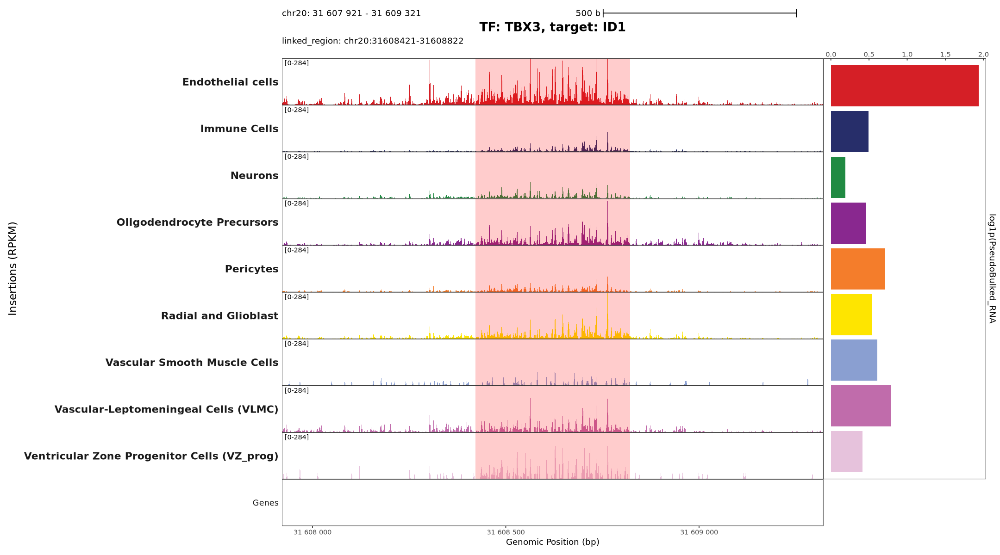

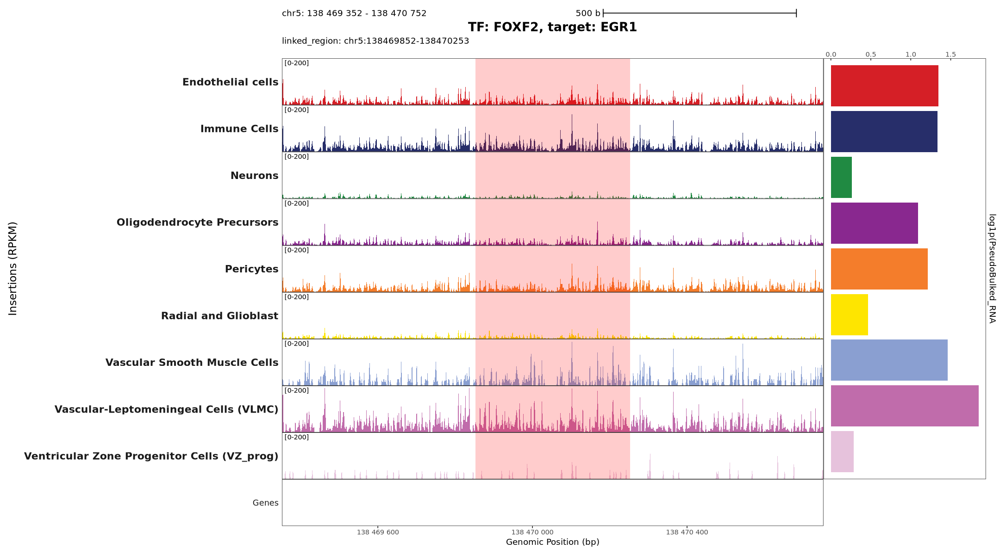

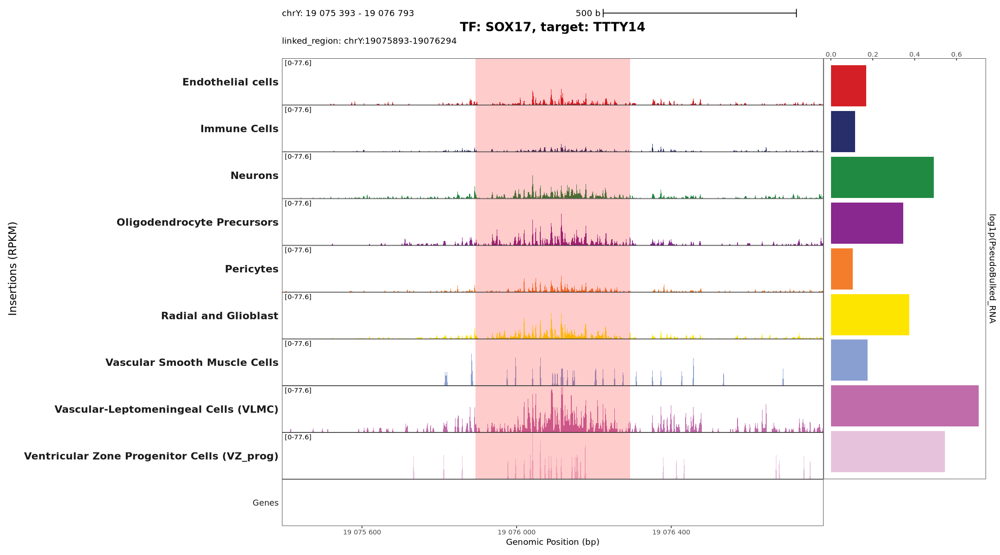

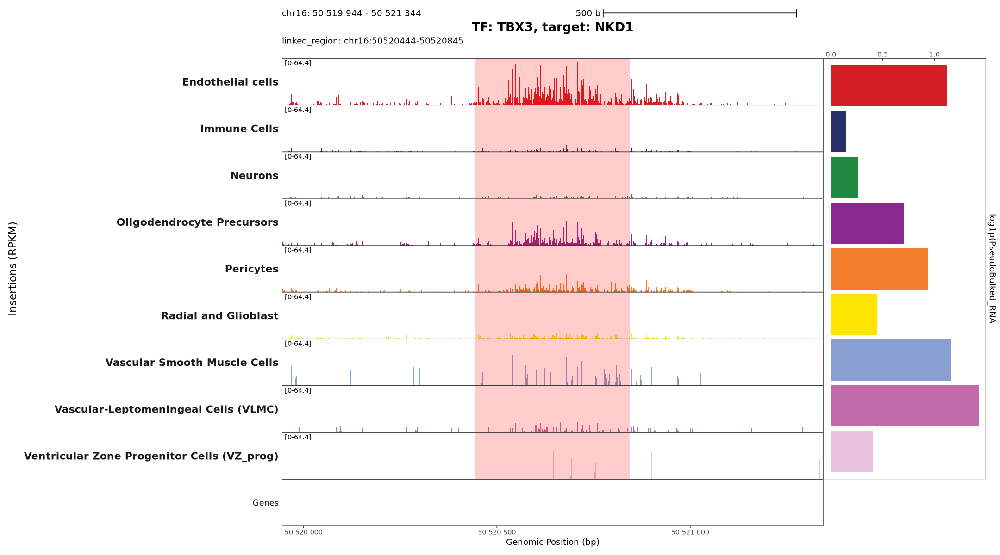

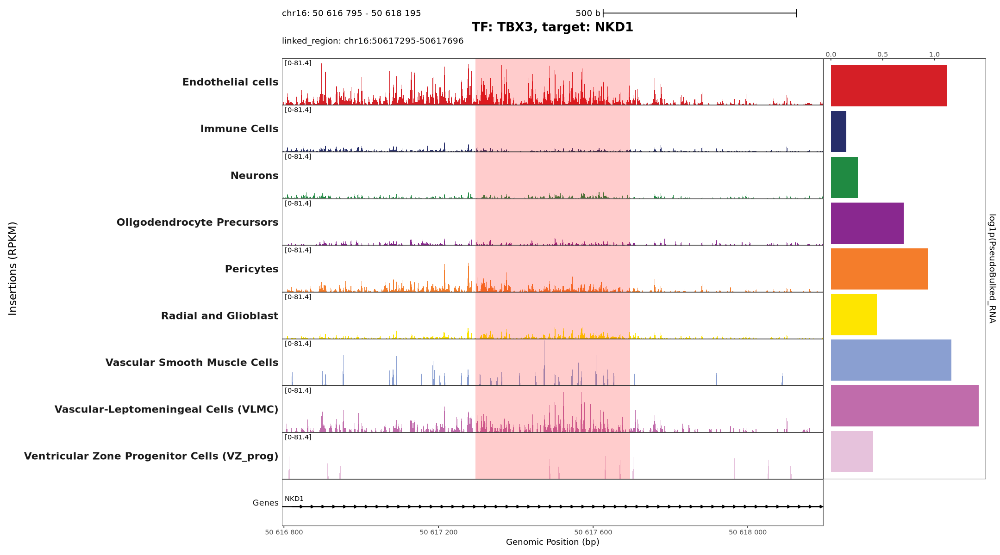

...

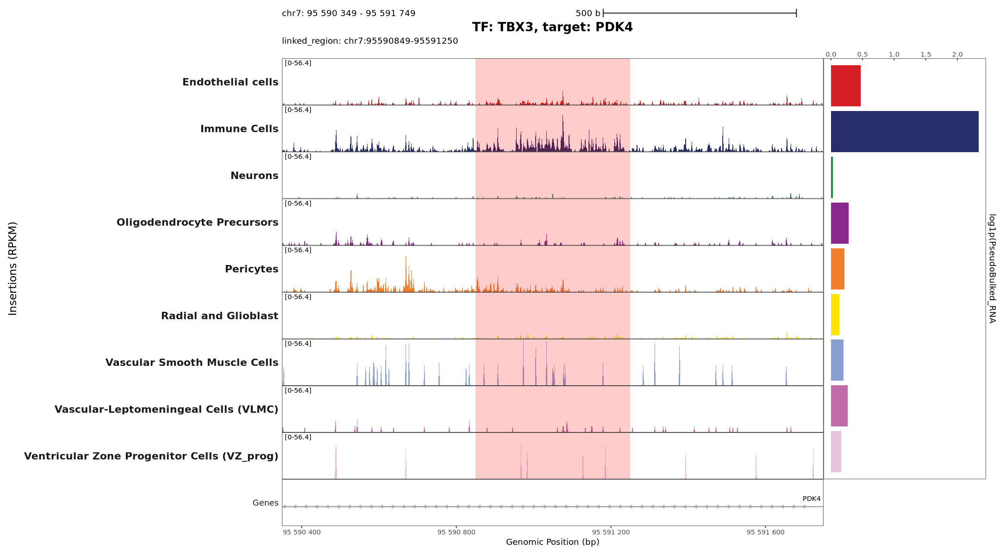

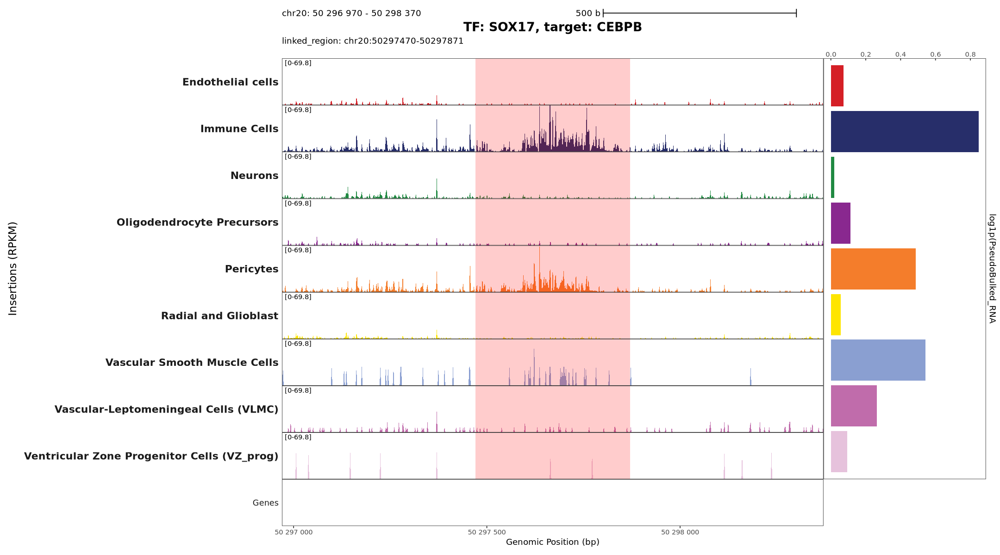

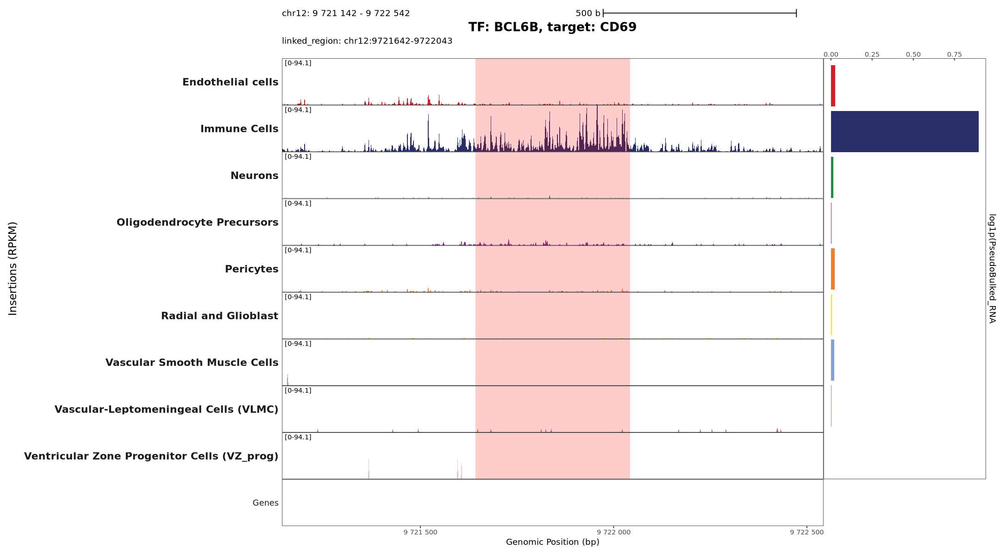

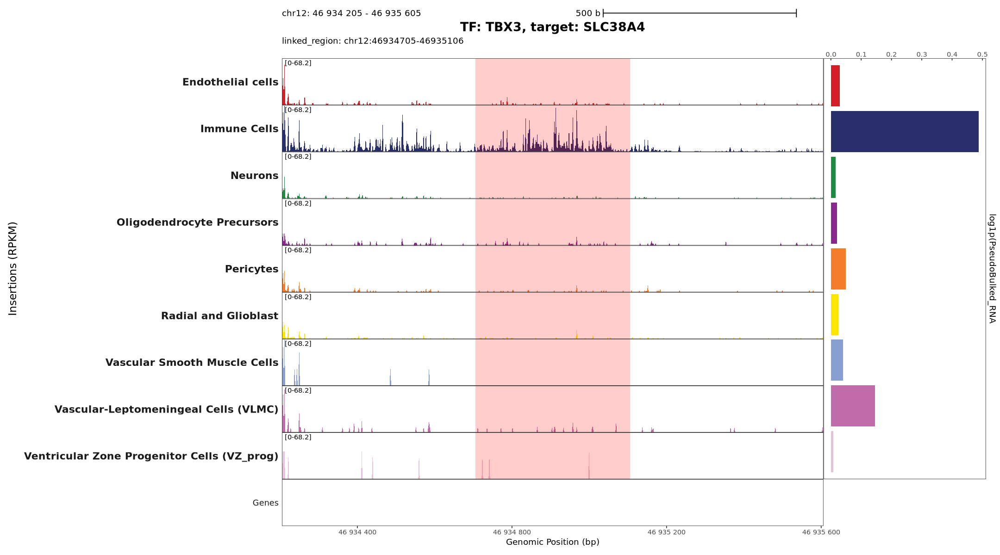

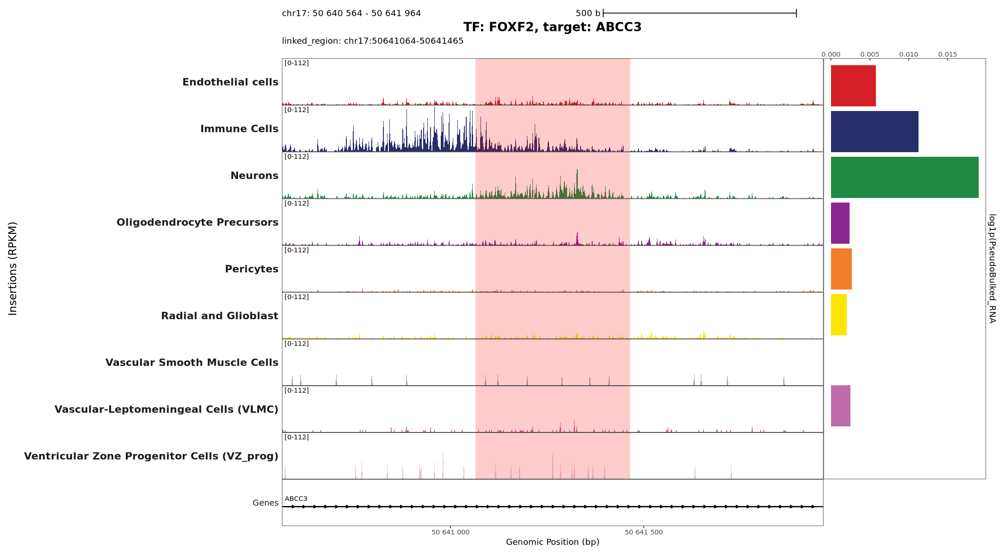

In [127]:
# view plots:

for(i in seq_along(plot_list)) {

    print(plot_list[[i]])

    }

In [128]:
# zoomed-out views with exact peak region highlights:

plot_list <- list()

for(i in seq_along(selected_regions[is_included])) {

plot_list[[i]] <- 
        plot_detailed_genome_coverage_w_BULKED_EXPRESSION(
                               total_reads_per_cell = read_counts,
                               tf_name = respective_tf_names[is_included][i], 
                               target_name = respective_targets[is_included][i],
                               my_region = selected_regions[is_included][i],
                               highlight_buffer = 0,
                               bulked_rna_data = mat_rna_norm_pseudobulk,
                               bins_value = 500, 
                               extend.bp = 10000, # extend more
                               genes_info = genes_info,
                               transcripts_info = transcripts_info,
                               fragments = subsetted_fragments,  
                               cell_types = metadata$main_cell_types)
}

[1] "Expanded region: chr20 31598421 31618822"
[1] "Original region: chr20 31608421 31608822"
[1] "Expanded region: chr5 138459852 138480253"
[1] "Original region: chr5 138469852 138470253"
[1] "Expanded region: chrY 19065893 19086294"
[1] "Original region: chrY 19075893 19076294"
[1] "Expanded region: chr16 50510444 50530845"
[1] "Original region: chr16 50520444 50520845"
[1] "Expanded region: chr16 50607295 50627696"
[1] "Original region: chr16 50617295 50617696"
[1] "Expanded region: chr10 71253364 71273765"
[1] "Original region: chr10 71263364 71263765"
[1] "Expanded region: chr1 21527759 21548160"
[1] "Original region: chr1 21537759 21538160"
[1] "Expanded region: chr16 50492569 50512970"
[1] "Original region: chr16 50502569 50502970"
[1] "Expanded region: chr1 34833966 34854367"
[1] "Original region: chr1 34843966 34844367"
[1] "Expanded region: chr7 101116881 101137282"
[1] "Original region: chr7 101126881 101127282"
[1] "Expanded region: chr1 21520338 21540739"
[1] "Original re

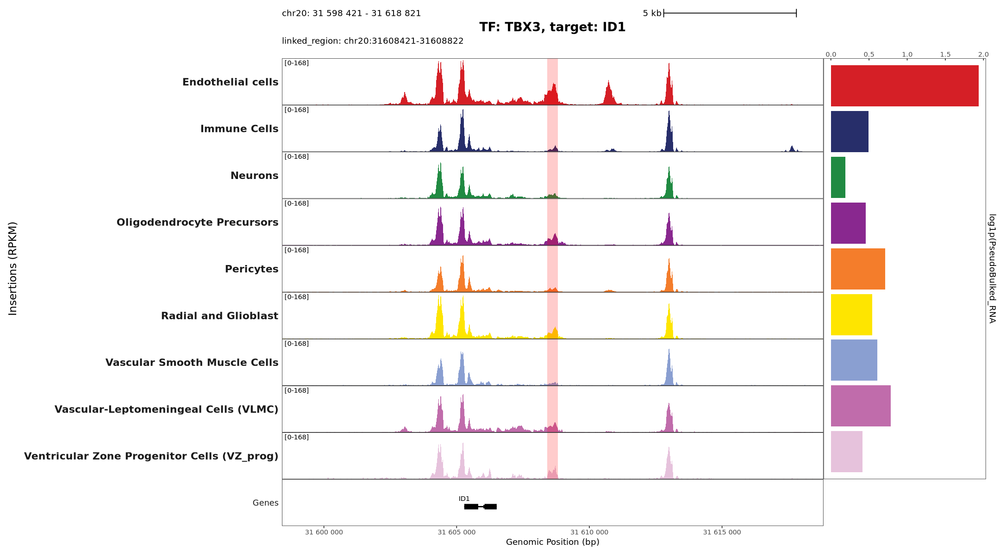

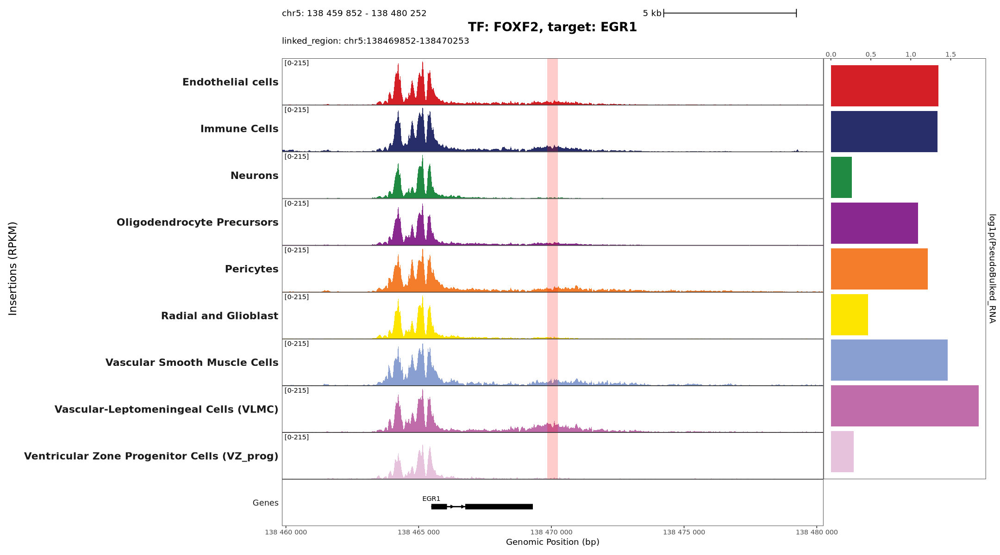

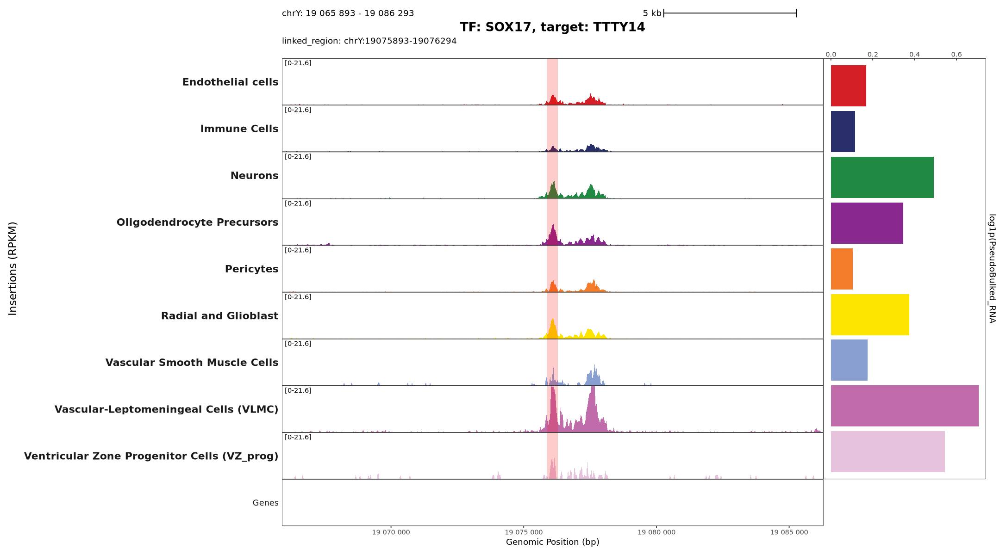

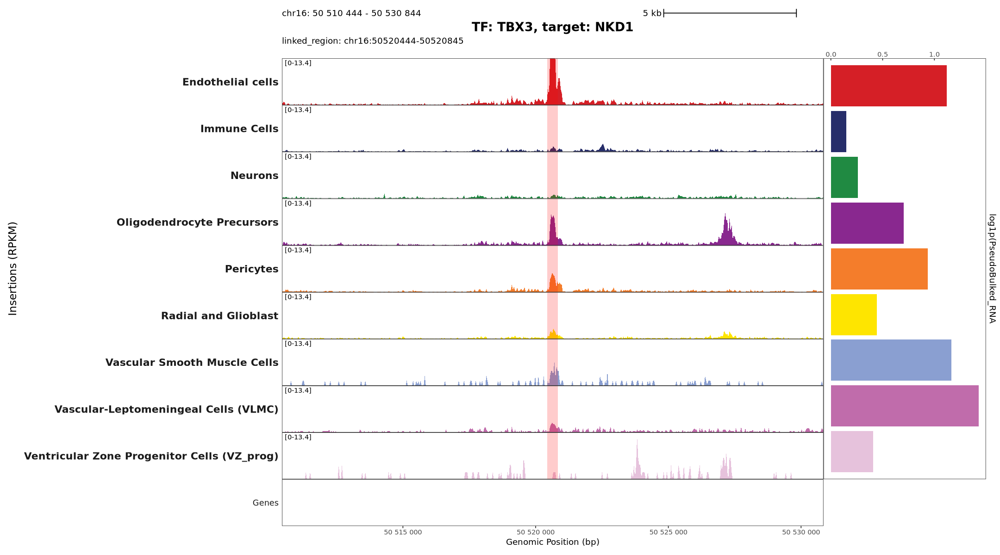

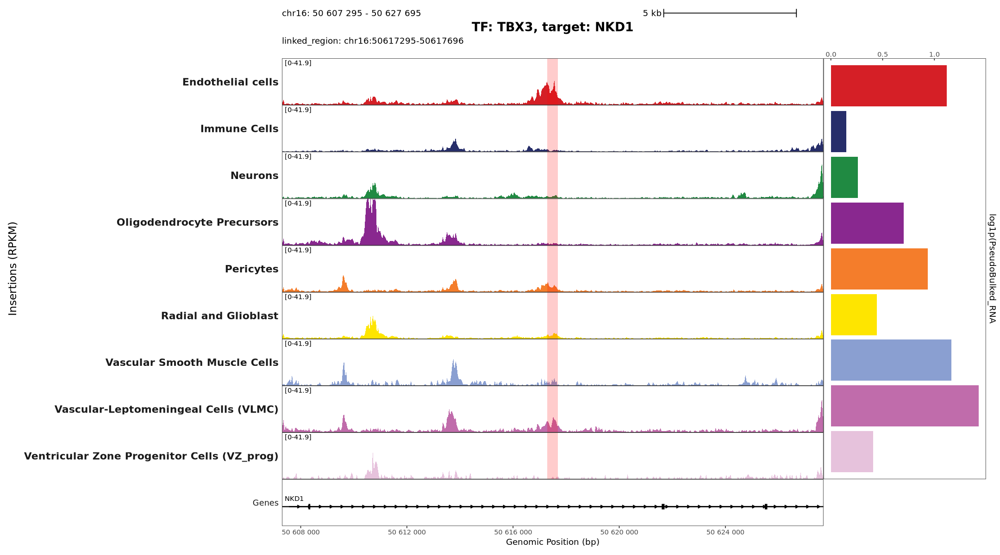

...

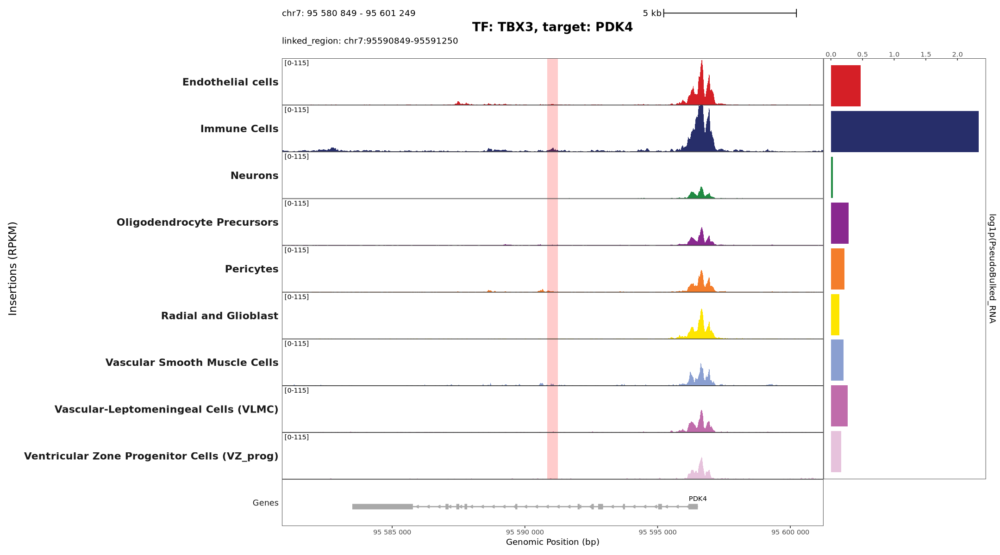

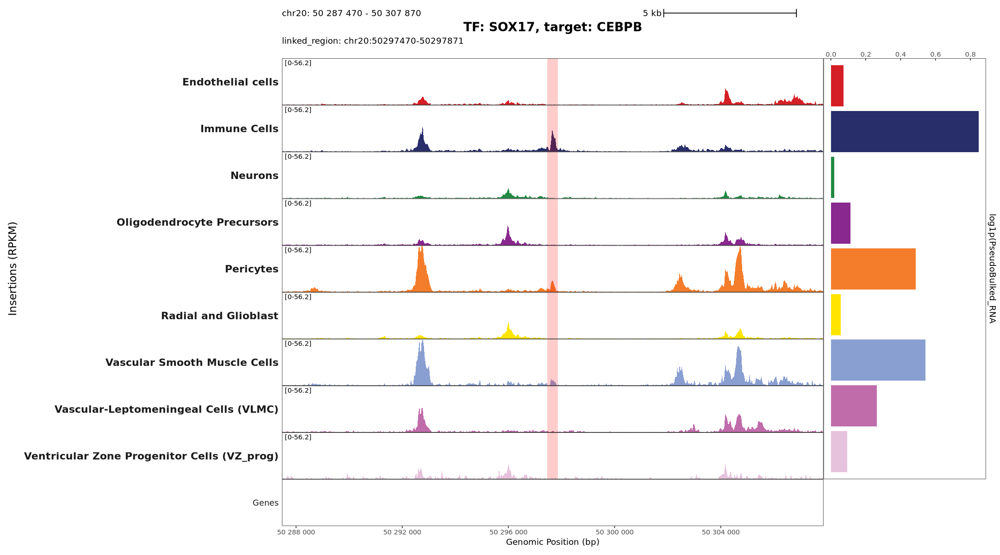

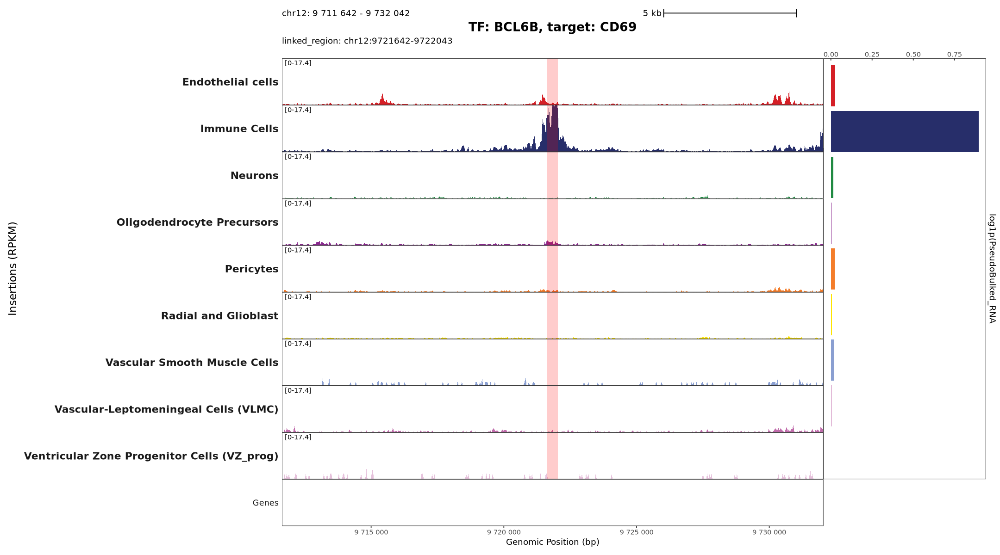

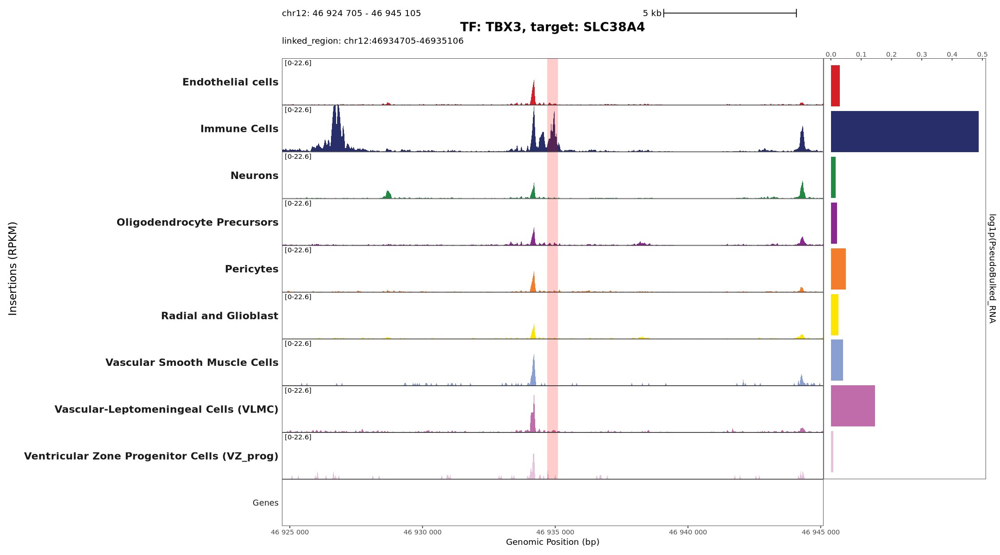

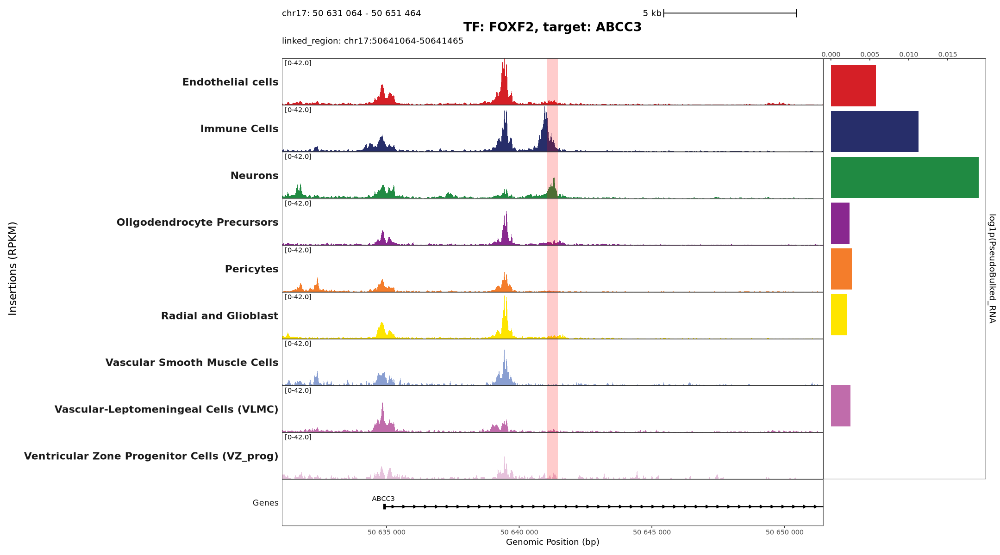

In [129]:
# view plots:

for(i in seq_along(plot_list)){

    print(plot_list[[i]])
    
    }

In [130]:
# view SOX17 gene:

mat_rna_norm_pseudobulk['SOX17',] %>% print()

                          Endothelial cells 
                                0.675168442 
                               Immune Cells 
                                0.039833609 
                                    Neurons 
                                0.004431727 
                 Oligodendrocyte Precursors 
                                0.010871962 
                                  Pericytes 
                                0.097762011 
                       Radial and Glioblast 
                                0.016344238 
               Vascular Smooth Muscle Cells 
                                0.049445934 
       Vascular-Leptomeningeal Cells (VLMC) 
                                0.035721700 
Ventricular Zone Progenitor Cells (VZ_prog) 
                                0.000000000 


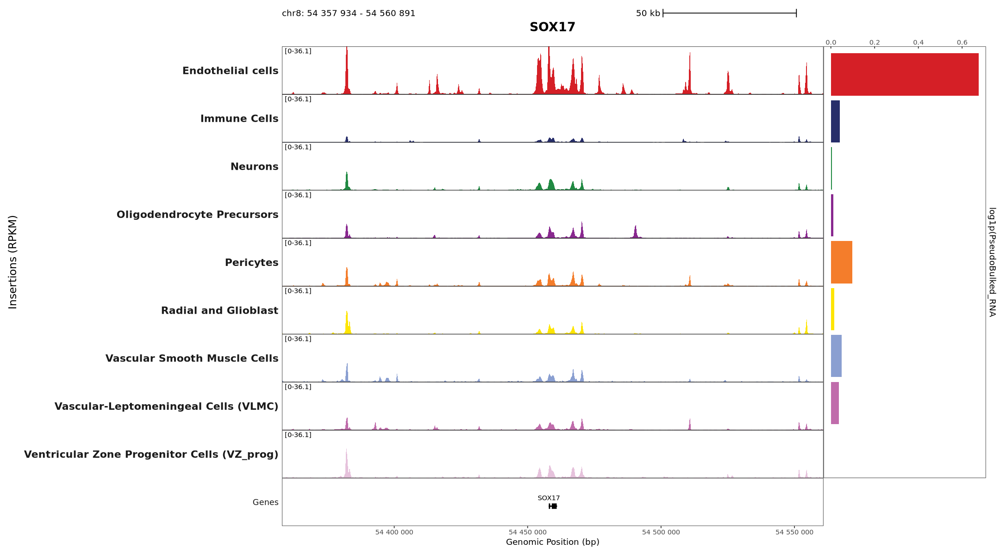

In [132]:
plot_gene_coverage_w_BULK_expression(total_reads_per_cell = read_counts,
                                       bulked_rna_data = mat_rna_norm_pseudobulk,
                                       bins_value = 500, 
                                       extend.bp = 1e5 , 
                                       genes_info = genes_info,
                                       transcripts_info = transcripts_info,
                                       fragments = subsetted_fragments,  
                                       gene = 'SOX17', 
                                       cell_types = metadata$main_cell_types)

Warning message:
"ggrepel: 7 unlabeled data points (too many overlaps). Consider increasing max.overlaps"


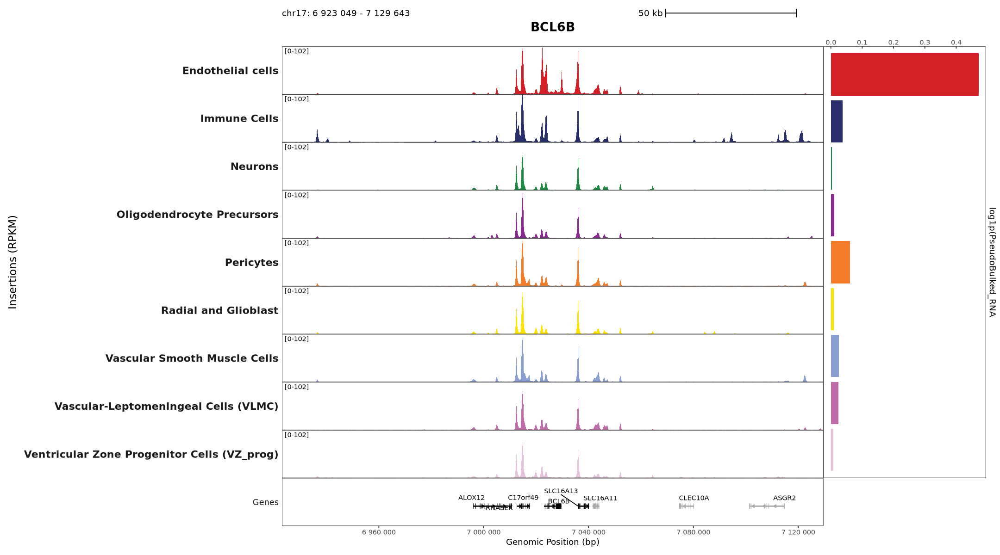

In [133]:
plot_gene_coverage_w_BULK_expression(total_reads_per_cell = read_counts,
                                       bulked_rna_data = mat_rna_norm_pseudobulk,
                                       bins_value = 500, 
                                       extend.bp = 1e5 , 
                                       genes_info = genes_info,
                                       transcripts_info = transcripts_info,
                                       fragments = subsetted_fragments,  
                                       gene = 'BCL6B', 
                                       cell_types = metadata$main_cell_types)

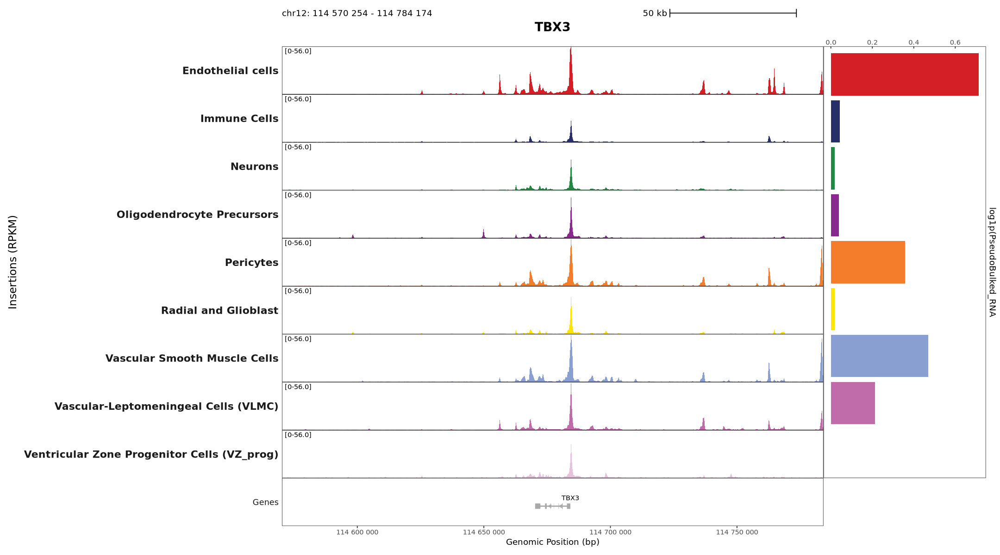

In [134]:
plot_gene_coverage_w_BULK_expression(total_reads_per_cell = read_counts,
                                       bulked_rna_data = mat_rna_norm_pseudobulk,
                                       bins_value = 500, 
                                       extend.bp = 1e5 , 
                                       genes_info = genes_info,
                                       transcripts_info = transcripts_info,
                                       fragments = subsetted_fragments,  
                                       gene = 'TBX3', 
                                       cell_types = metadata$main_cell_types)

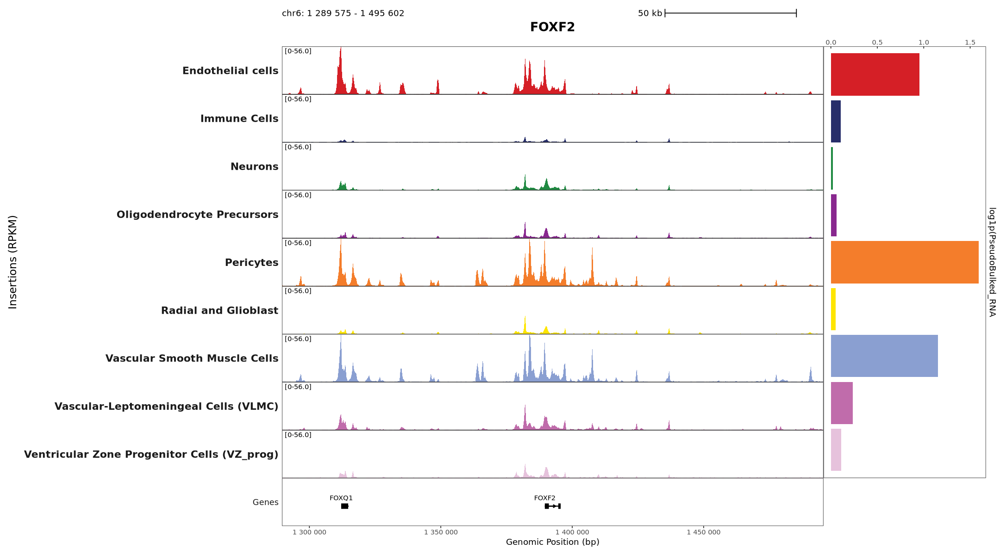

In [135]:
plot_gene_coverage_w_BULK_expression(total_reads_per_cell = read_counts,
                                       bulked_rna_data = mat_rna_norm_pseudobulk,
                                       bins_value = 500, 
                                       extend.bp = 1e5 , 
                                       genes_info = genes_info,
                                       transcripts_info = transcripts_info,
                                       fragments = subsetted_fragments,  
                                       gene = 'FOXF2', 
                                       cell_types = metadata$main_cell_types)

In [137]:
mat_rna_norm_pseudobulk %>% head()

,Endothelial cells,Immune Cells,Neurons,Oligodendrocyte Precursors,Pericytes,Radial and Glioblast,Vascular Smooth Muscle Cells,Vascular-Leptomeningeal Cells (VLMC),Ventricular Zone Progenitor Cells (VZ_prog)
FO538757.1,0.0032115281,0.0112655768,0.0096690206,0.009068157,0.008040106,0.0120689556,0.01008671,0.007496120,0.008195189
RP11-206L10.9,0.0347719823,0.1167897699,0.1348374551,0.088293401,0.054968753,0.1156270971,0.02502855,0.091035264,0.101631245
FAM87B,0.0006431313,0.0119958986,0.0016642002,0.005450756,0.001344515,0.0017330801,0.01008671,0.001253262,0.000000000
FAM41C,0.0000000000,0.0002462582,0.0002775591,0.000000000,0.001344515,0.0002890553,0.00000000,0.000000000,0.000000000
RP11-54O7.3,0.0000000000,0.0002462582,0.0096690206,0.001820222,0.000896544,0.0031750227,0.00000000,0.007496120,0.000000000
SAMD11,0.0096038071,0.0173353563,0.0740814731,0.032267587,0.007595125,0.0399538048,0.01008671,0.065524203,0.016323762


In [138]:
mat_rna_norm_pseudobulk %>% dim()

[1] 20639     9

In [139]:
mat_rna_norm_pseudobulk %>% saveRDS(file = here::here('r_objects', 'mat_rna_norm_pseudobulk.RDS'))

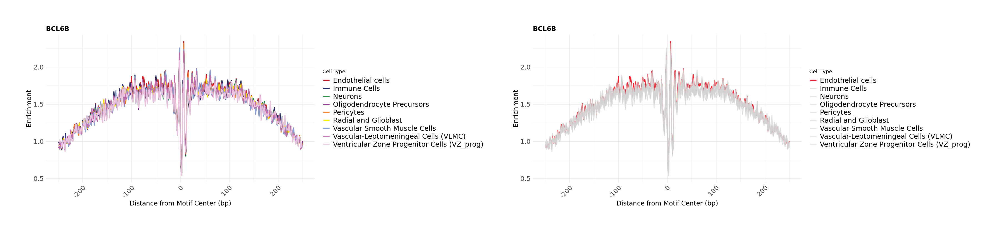

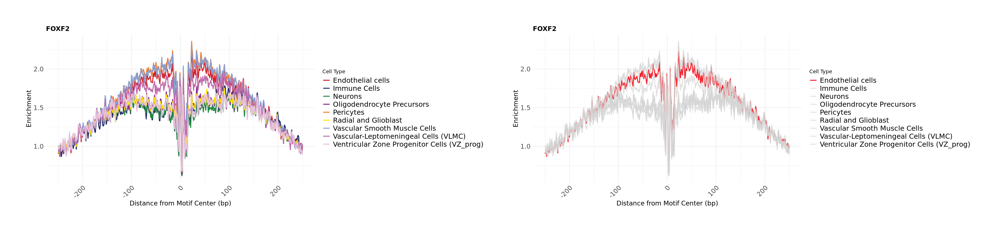

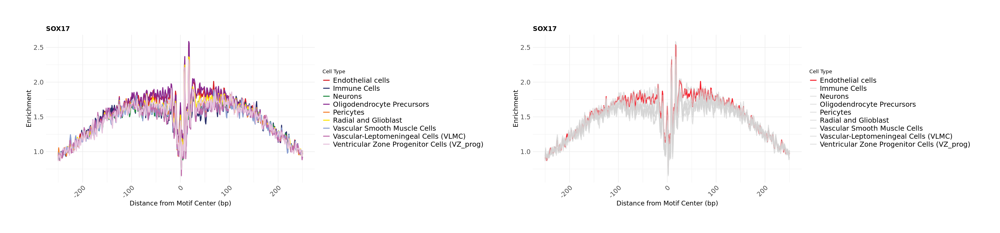

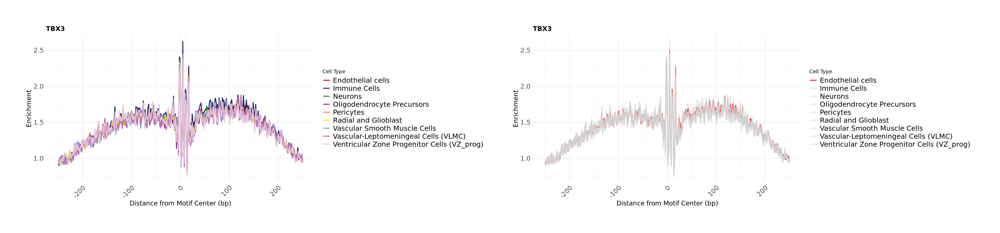

In [140]:
options(repr.plot.width = 30, repr.plot.height = 7)

for(each_plot in my_important_TFs_plots){

    print(each_plot)
    
    }

In [141]:
# Next: I will focus on hypoxia-response relevant TF-regulon sets

In [142]:
sessionInfo()

R version 4.4.2 (2024-10-31)
Platform: x86_64-unknown-linux-gnu
Running under: Red Hat Enterprise Linux 9.4 (Plow)

Matrix products: default
BLAS/LAPACK: /gnu/store/mj1kw87qd3m1q7r4844adkn5hifx8k6a-openblas-0.3.20/lib/libopenblasp-r0.3.20.so;  LAPACK version 3.9.0

locale:
 [1] LC_CTYPE=C          LC_NUMERIC=C        LC_TIME=C          
 [4] LC_COLLATE=C        LC_MONETARY=C       LC_MESSAGES=C.UTF-8
 [7] LC_PAPER=C          LC_NAME=C           LC_ADDRESS=C       
[10] LC_TELEPHONE=C      LC_MEASUREMENT=C    LC_IDENTIFICATION=C

time zone: Europe/Berlin
tzcode source: system (glibc)

attached base packages:
[1] stats4    stats     graphics  grDevices utils     datasets  methods  
[8] base     

other attached packages:
 [1] AnnotationFilter_1.30.0           GenomicFeatures_1.58.0           
 [3] AnnotationDbi_1.68.0              Biobase_2.66.0                   
 [5] BSgenome.Hsapiens.UCSC.hg38_1.4.5 BSgenome_1.74.0                  
 [7] rtracklayer_1.66.0                BiocIO_1.16.0